# IMPORT LIBRARY

In [1]:
import os
import sys
import time
import numpy as np
import matplotlib.pyplot as plt
module_path = os.path.abspath(os.path.join('../../fusion'))
sys.path.append(module_path)

In [2]:
from preprocessing_datasets import load_dataset
from embedding_algorithms import sentence_embedding, set_embedding_model
from dimensionality_reduction_algorithms import dimension_reduction_algorithms
from cluster_algorithms import cluster_algorithm

from helper import load_by_index, get_author_candidates, getFinalAuthors
from plot_tools import plotChart, plotCluster

In [3]:
key_values = {
    'model_type':'bilstm',
    'char_level':False,
    'model_version': 2,
    'rnn_dim':1024,
    'verbose':1,
    'attributes_list': ['author','title','big_cate', 'small_cate'],
    'embedding_type': 'inferSent',
    'dataset': 'merged_book-multiAuthors',
    'dimension_reduction': 'pca',
    'num_components': 2,
    'cluster_method': 'hierarchy',
    'num_clusters': 10,
    'block_length_thresold': 0.2,
}

# SETUP INFERSENT

In [4]:
set_embedding_model(key_values)

Vocab size : 2196017
model_version: 2
rnn_dim: 1024
model_type: bilstm
char_level: False
Setup time is: 204.71879291534424


# LOAD

In [5]:
dataset_name, table_group_by_isbn, isbn_list, true_authors = load_dataset(key_values)

dataset: merged_book-multiAuthors
Loading time is: 5.908268928527832


In [6]:
table_ISBN, list_authors, true_author = load_by_index(table_group_by_isbn, isbn_list, true_authors, 0, key_values['verbose'])

ISBN: 1878685546
true author: Alan Shepard, Deke Slayton


In [7]:
#table_ISBN['author'].value_counts()

In [8]:
embeddings_tokens = sentence_embedding(table_ISBN, key_values)

embedding_type: inferSent
attributes_list: ['author', 'title', 'big_cate', 'small_cate']
model_type: bilstm
char_level: False
Embedding time is: 4.063290119171143


dimension_reduction: pca
num_components: 2
Dimension reduction time is: 0.17869997024536133
rows: 454
classes: 454


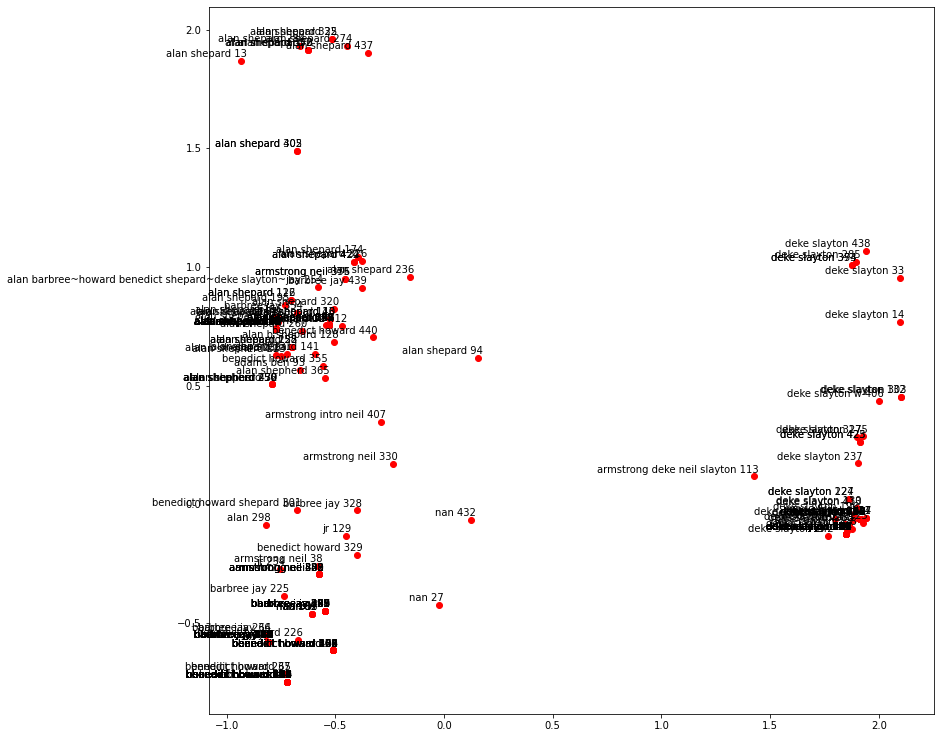

In [9]:
pca_embeddings = dimension_reduction_algorithms(embeddings_tokens, key_values)
plotChart(list_authors, pca_embeddings)

cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.21883630752563477
num of classes: 10


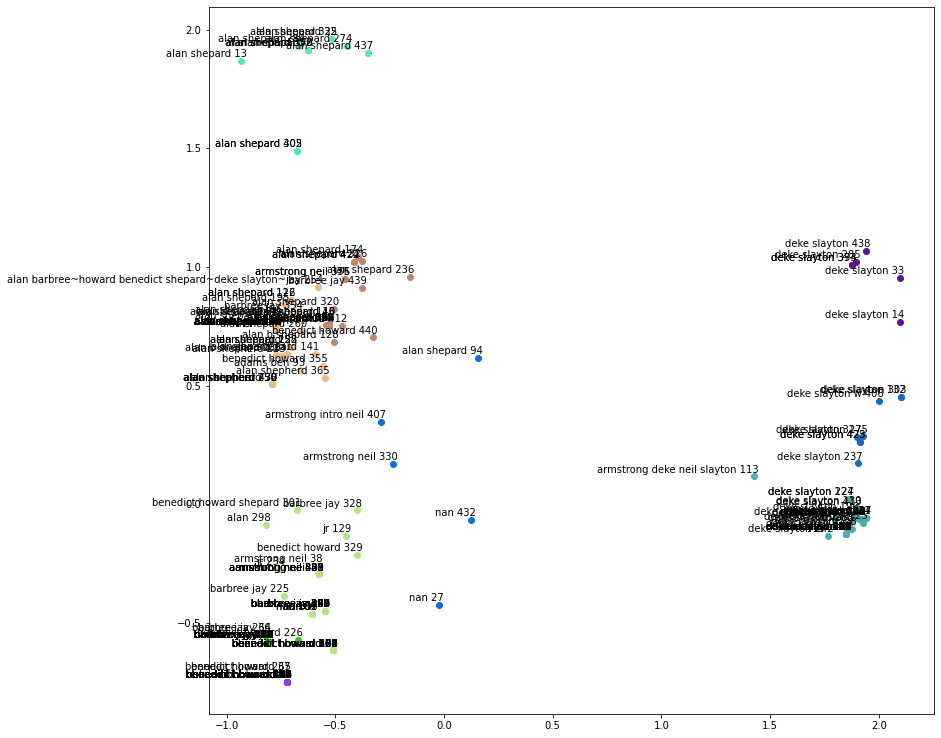

In [10]:
blocks = cluster_algorithm(pca_embeddings, key_values)
plotCluster(blocks, list_authors, key_values['num_clusters'], pca_embeddings)

In [11]:
listCandidates = get_author_candidates(list_authors, blocks, key_values['block_length_thresold'] * len(pca_embeddings), key_values['verbose'])

Discarted candidate: [{'barbree jay': 72, 'benedict howard': 1}, {'benedict howard': 70}, {'alan': 1, 'armstrong neil': 7, 'barbree jay': 15, 'benedict howard': 14, 'benedict howard shepard': 1, 'jr': 2, 'nan': 4}, {'alan b shepard': 1, 'alan shepard': 23, 'armstrong neil': 2, 'barbree jay': 1, 'benedict howard': 1}, {'alan shepard': 11}, {'deke slayton': 7, 'deke slayton w': 1}, {'deke slayton': 6}, {'alan shepard': 1, 'armstrong intro neil': 1, 'armstrong neil': 1, 'nan': 2}]
Possible candidate: [{'armstrong deke neil slayton': 1, 'deke slayton': 108}, {'adams ben': 1, 'alan b shepard': 1, 'alan barbree~howard benedict shepard~deke slayton~jay': 1, 'alan shepard': 88, 'alan shepherd': 6, 'alan shpard': 1, 'barbree jay': 1, 'benedict howard': 1}]
lengthNecessary: 90.80000000000001


In [12]:
listCandidates

[{'armstrong deke neil slayton': 1, 'deke slayton': 108},
 {'adams ben': 1,
  'alan b shepard': 1,
  'alan barbree~howard benedict shepard~deke slayton~jay': 1,
  'alan shepard': 88,
  'alan shepherd': 6,
  'alan shpard': 1,
  'barbree jay': 1,
  'benedict howard': 1}]

In [16]:
def getFinalAuthors(listCandidates):
    solution = []
    for candidate in listCandidates:
        solution.append(max(candidate, key=candidate.get))
    return solution

In [19]:
print(getFinalAuthors(listCandidates))
print(true_author)

['deke slayton', 'alan shepard']
Alan Shepard, Deke Slayton


>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 2<<<<<<<<<<<<<<<<<<<<<<<<
ISBN: 0394558588
true author: Jimmy Carter, Rosalynn Carter
-------------------------------
tot cases of author's name: 8
-------------------------------
embedding_type: inferSent
attributes_list: ['author', 'title', 'big_cate', 'small_cate']
model_type: bilstm
char_level: False
Embedding time is: 1.6783170700073242
-------------------------------
dimension_reduction: pca
num_components: 2
Dimension reduction time is: 0.019012928009033203
rows: 261
classes: 261


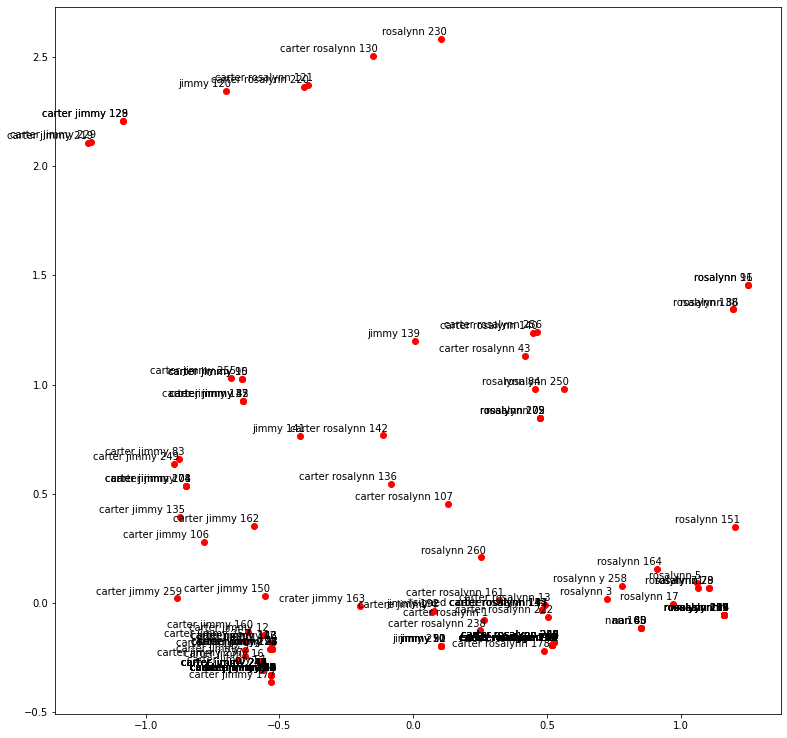

-------------------------------
cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.0040318965911865234
num of classes: 10


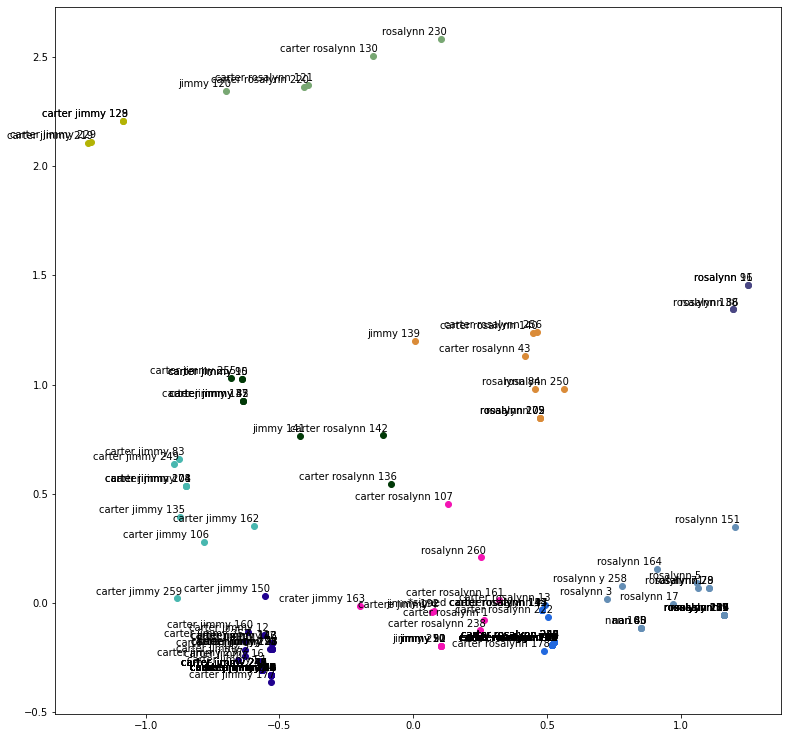

-------------------------------
lengthNecessary: 52.2
[{'carter jimmy': 107}, {'*signed carter rosalynn': 1, 'carter rosalynn': 77}]
['carter jimmy', 'carter rosalynn'] VS true_author: Jimmy Carter, Rosalynn Carter
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 3<<<<<<<<<<<<<<<<<<<<<<<<
ISBN: 0810932776
true author: Vadim Petrov, Igor Lysenho, Georgy Egorgy
-------------------------------
tot cases of author's name: 29
-------------------------------
embedding_type: inferSent
attributes_list: ['author', 'title', 'big_cate', 'small_cate']
model_type: bilstm
char_level: False
Embedding time is: 4.902736186981201
-------------------------------
dimension_reduction: pca
num_components: 2
Dimension reduction time is: 0.03962588310241699
rows: 472
classes: 472


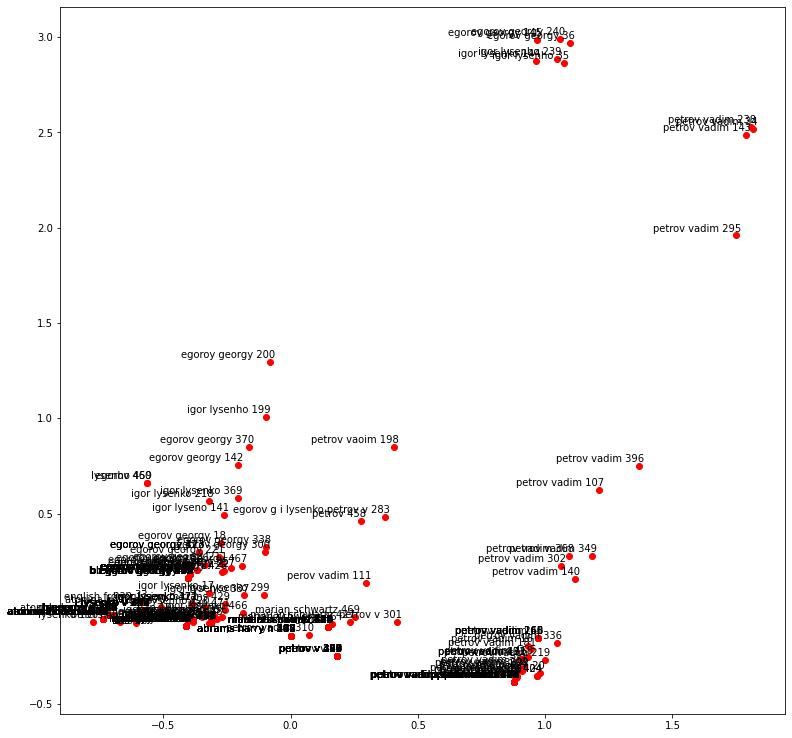

-------------------------------
cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.00875711441040039
num of classes: 10


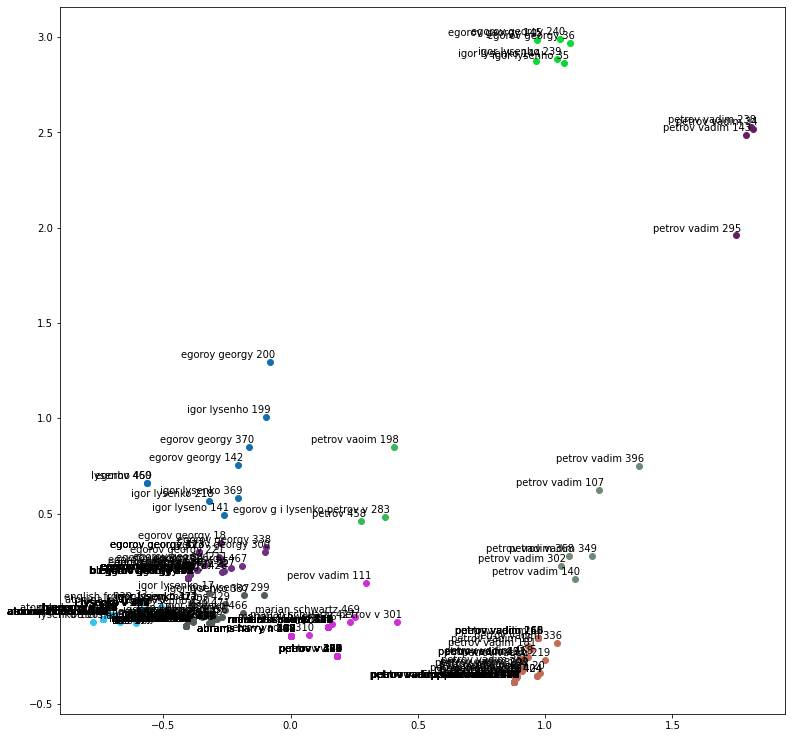

-------------------------------
lengthNecessary: 94.4
[{'petrov vadim': 97, 'petrov vadim vadimovich': 10}, {'antonina bovis': 1, 'egorov georg': 1, 'english from russian to trans': 1, 'igor lysenho': 7, 'igor lysenkho': 1, 'igor lysenki': 6, 'igor lysenko': 70, 'igor lysenko v': 11, 'nan': 1}, {'b egorov georgy': 12, 'egorov georgy': 84}]
['petrov vadim', 'igor lysenko', 'egorov georgy'] VS true_author: Vadim Petrov, Igor Lysenho, Georgy Egorgy
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 4<<<<<<<<<<<<<<<<<<<<<<<<
ISBN: 0446528382
true author: Jack Welch, John A. Byrne
-------------------------------
tot cases of author's name: 9
-------------------------------
embedding_type: inferSent
attributes_list: ['author', 'title', 'big_cate', 'small_cate']
model_type: bilstm
char_level: False
Embedding time is: 0.8900609016418457
-------------------------------
dimension_reduction: pca
num_components:

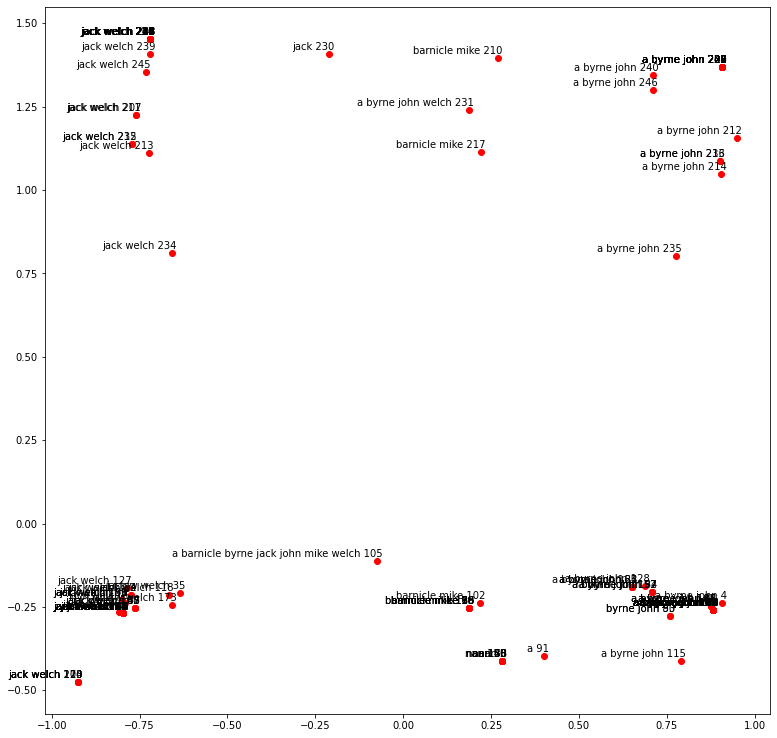

-------------------------------
cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.004086971282958984
num of classes: 10


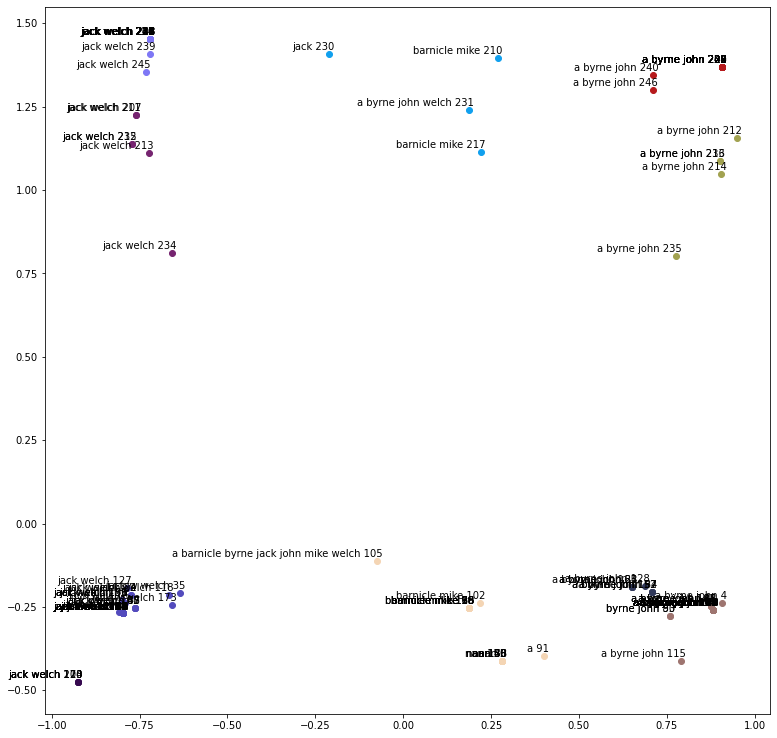

-------------------------------
lengthNecessary: 49.400000000000006
[{'jack w welch': 2, 'jack welch': 94}, {'a byrne john': 78, 'byrne john': 2}]
['jack welch', 'a byrne john'] VS true_author: Jack Welch, John A. Byrne
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 5<<<<<<<<<<<<<<<<<<<<<<<<
ISBN: 0060852550
true author: Barbara Kingsolver, Steven L. Hopp, Camille Kingsolver
-------------------------------
tot cases of author's name: 9
-------------------------------
embedding_type: inferSent
attributes_list: ['author', 'title', 'big_cate', 'small_cate']
model_type: bilstm
char_level: False
Embedding time is: 1.1596362590789795
-------------------------------
dimension_reduction: pca
num_components: 2
Dimension reduction time is: 0.016333818435668945
rows: 319
classes: 319


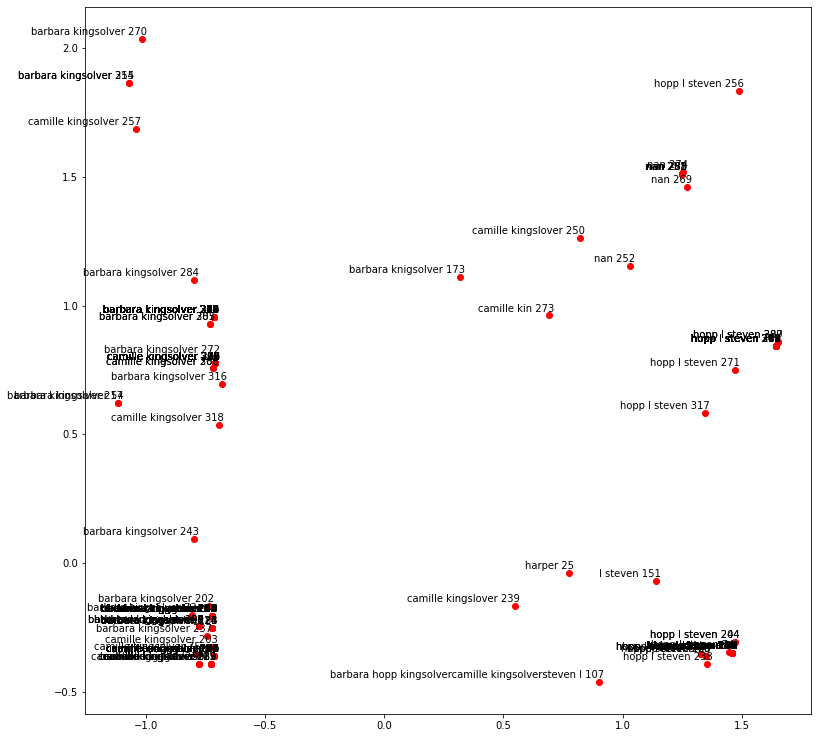

-------------------------------
cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.003972053527832031
num of classes: 10


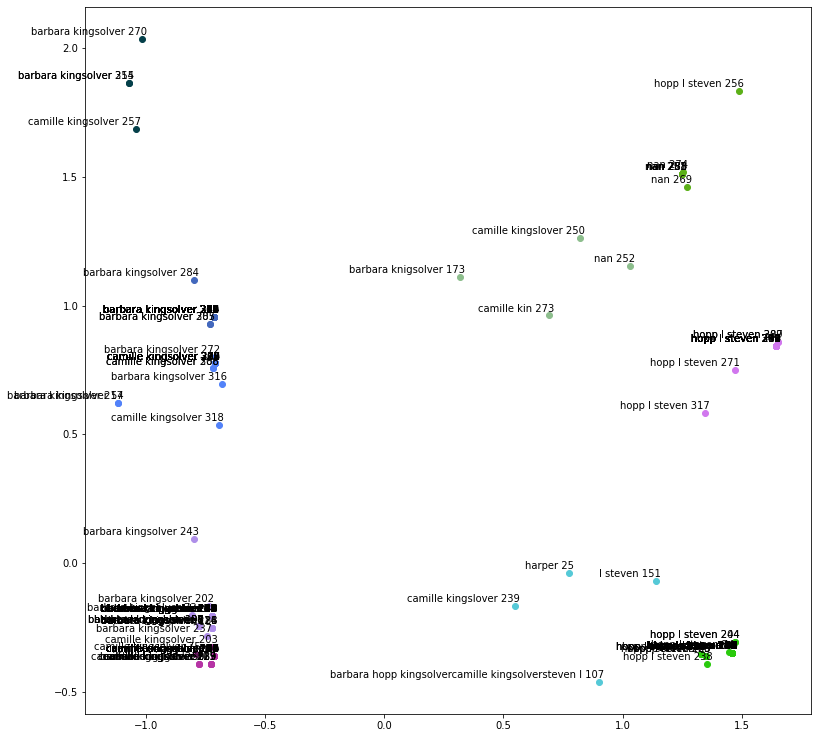

-------------------------------
lengthNecessary: 63.800000000000004
[{'barbara kingsolver': 86}, {'barbara kingsolver': 1, 'camille kingsolver': 77}, {'hopp l steven': 77}]
['barbara kingsolver', 'camille kingsolver', 'hopp l steven'] VS true_author: Barbara Kingsolver, Steven L. Hopp, Camille Kingsolver
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 6<<<<<<<<<<<<<<<<<<<<<<<<
ISBN: 0679432965
true author: Colin Powell, Joseph E. Persico
-------------------------------
tot cases of author's name: 9
-------------------------------
embedding_type: inferSent
attributes_list: ['author', 'title', 'big_cate', 'small_cate']
model_type: bilstm
char_level: False
Embedding time is: 0.9942729473114014
-------------------------------
dimension_reduction: pca
num_components: 2
Dimension reduction time is: 0.02025914192199707
rows: 226
classes: 226


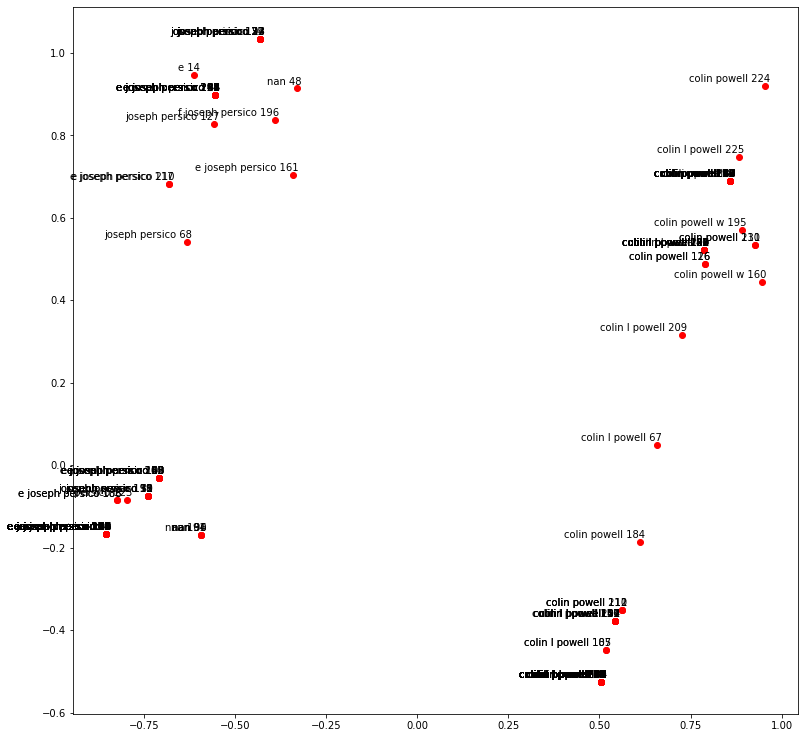

-------------------------------
cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.003551006317138672
num of classes: 10


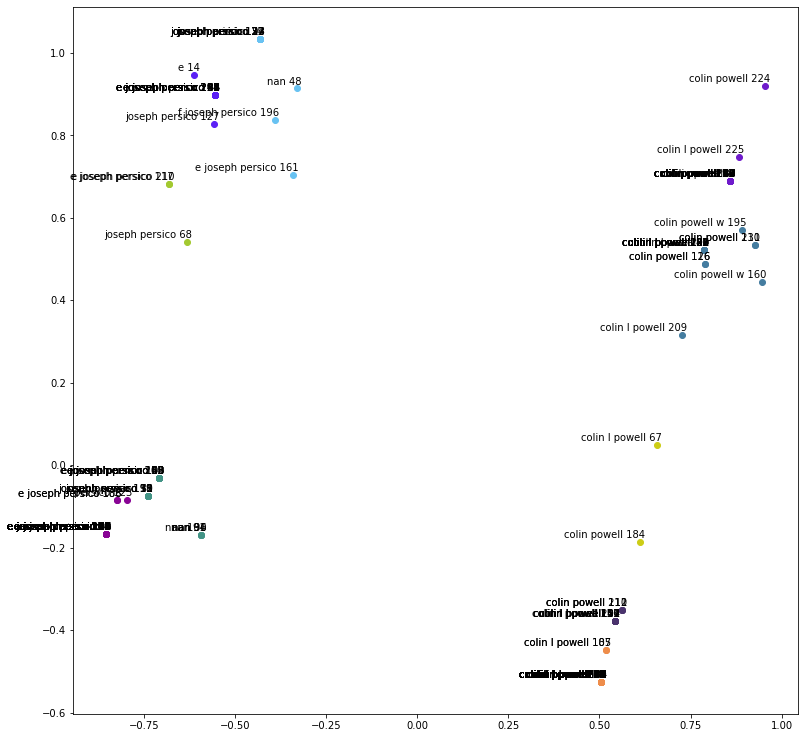

-------------------------------
lengthNecessary: 45.2
[{'colin l powell': 66}, {'e joseph persico': 58, 'persico': 1}]
['colin l powell', 'e joseph persico'] VS true_author: Colin Powell, Joseph E. Persico
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 7<<<<<<<<<<<<<<<<<<<<<<<<
ISBN: 0060852569
true author: Barbara Kingsolver, Steven L. Hopp, Camille Kingsolver
-------------------------------
tot cases of author's name: 14
-------------------------------
embedding_type: inferSent
attributes_list: ['author', 'title', 'big_cate', 'small_cate']
model_type: bilstm
char_level: False
Embedding time is: 1.2361440658569336
-------------------------------
dimension_reduction: pca
num_components: 2
Dimension reduction time is: 0.015611886978149414
rows: 320
classes: 320


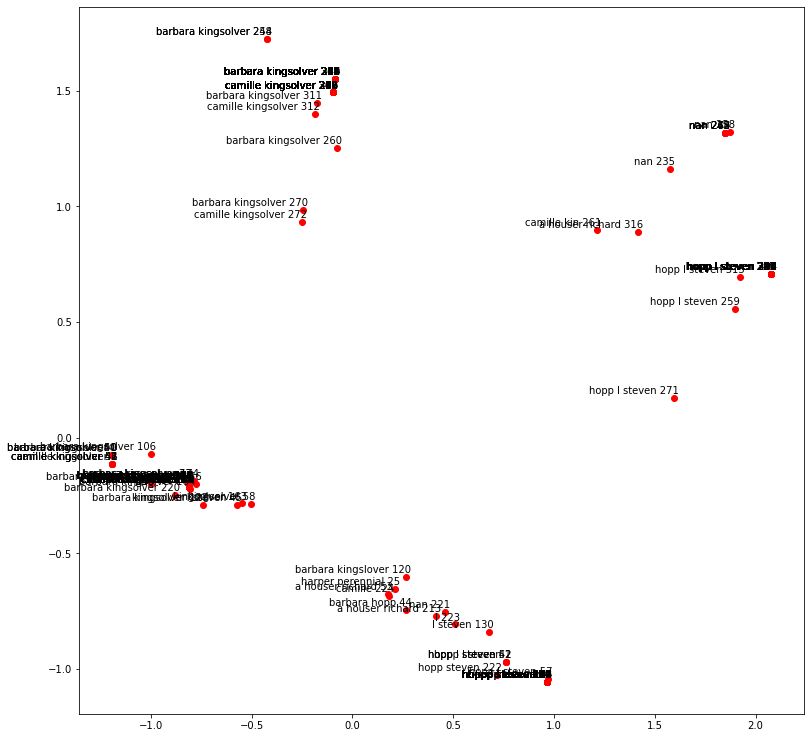

-------------------------------
cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.003342866897583008
num of classes: 10


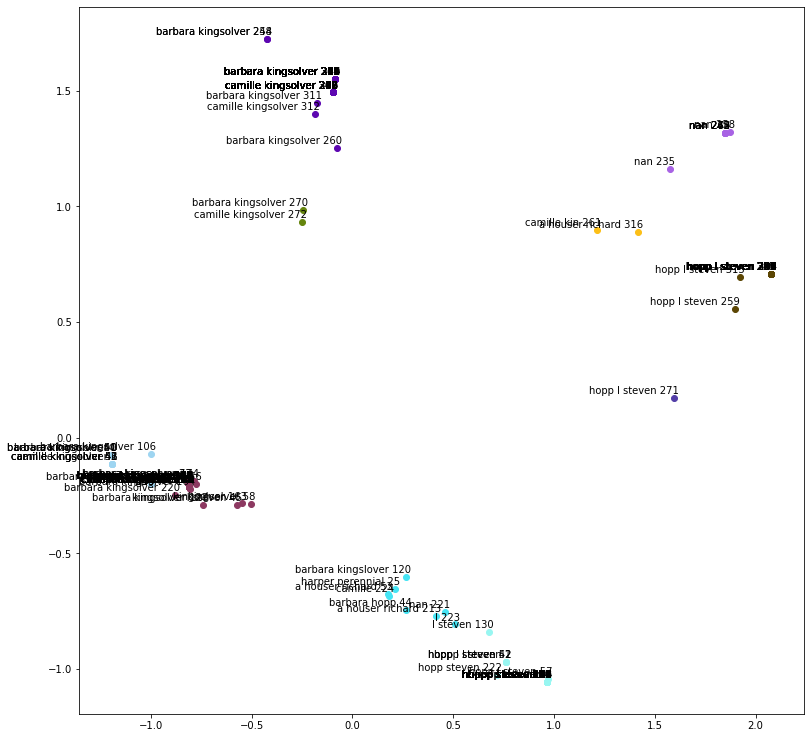

-------------------------------
lengthNecessary: 64.0
[{'barbara kingsolver': 79, 'camille kingsolver': 64, 'kingsolver': 2, 'kingsolver l steven': 1}, {'hopp l steven': 67, 'hopp steven': 1, 'l steven': 1}]
['barbara kingsolver', 'hopp l steven'] VS true_author: Barbara Kingsolver, Steven L. Hopp, Camille Kingsolver
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 8<<<<<<<<<<<<<<<<<<<<<<<<
ISBN: 0688123163
true author: Ken Blanchard, Sheldon Bowles
-------------------------------
tot cases of author's name: 14
-------------------------------
embedding_type: inferSent
attributes_list: ['author', 'title', 'big_cate', 'small_cate']
model_type: bilstm
char_level: False
Embedding time is: 1.1160609722137451
-------------------------------
dimension_reduction: pca
num_components: 2
Dimension reduction time is: 0.029994964599609375
rows: 228
classes: 228


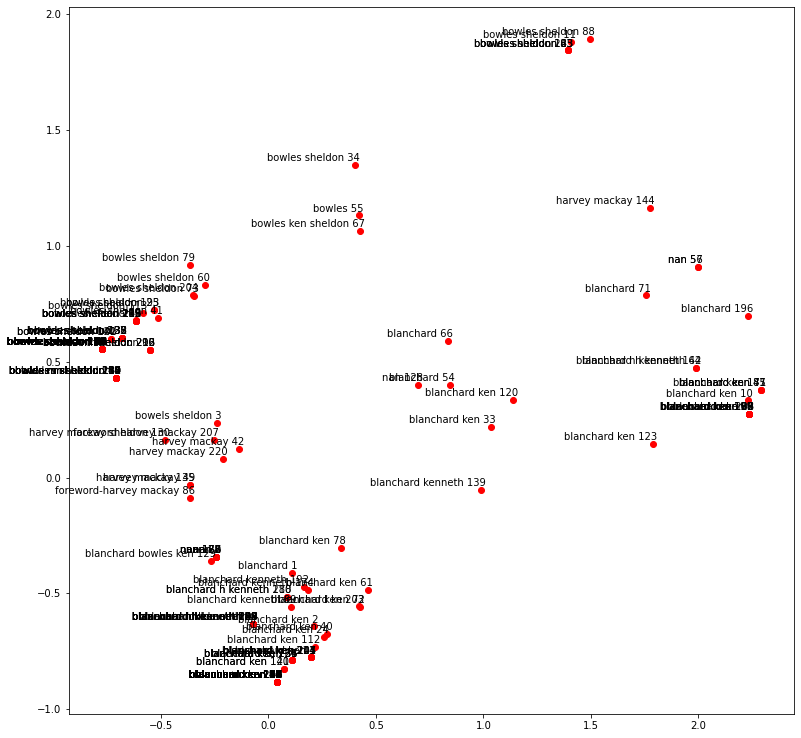

-------------------------------
cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.0021359920501708984
num of classes: 10


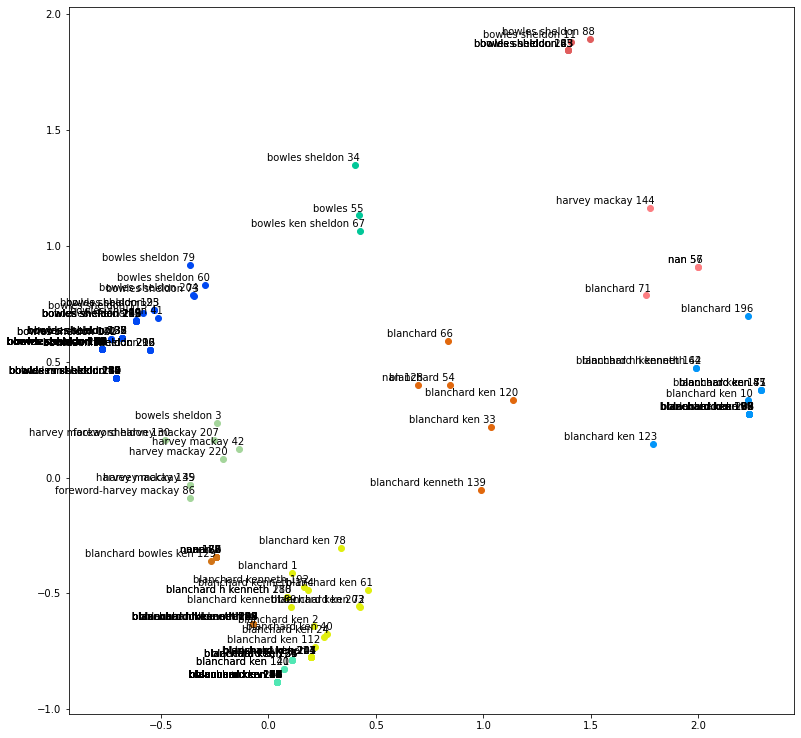

-------------------------------
lengthNecessary: 45.6
[{'bowles m sheldon': 15, 'bowles sheldon': 70}, {'blanchard ken': 61}]
['bowles sheldon', 'blanchard ken'] VS true_author: Ken Blanchard, Sheldon Bowles
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 9<<<<<<<<<<<<<<<<<<<<<<<<
ISBN: 0399135189
true author: Bob Hope, Melville Shavelson
-------------------------------
tot cases of author's name: 6
-------------------------------
embedding_type: inferSent
attributes_list: ['author', 'title', 'big_cate', 'small_cate']
model_type: bilstm
char_level: False
Embedding time is: 1.4435021877288818
-------------------------------
dimension_reduction: pca
num_components: 2
Dimension reduction time is: 0.011430025100708008
rows: 191
classes: 191


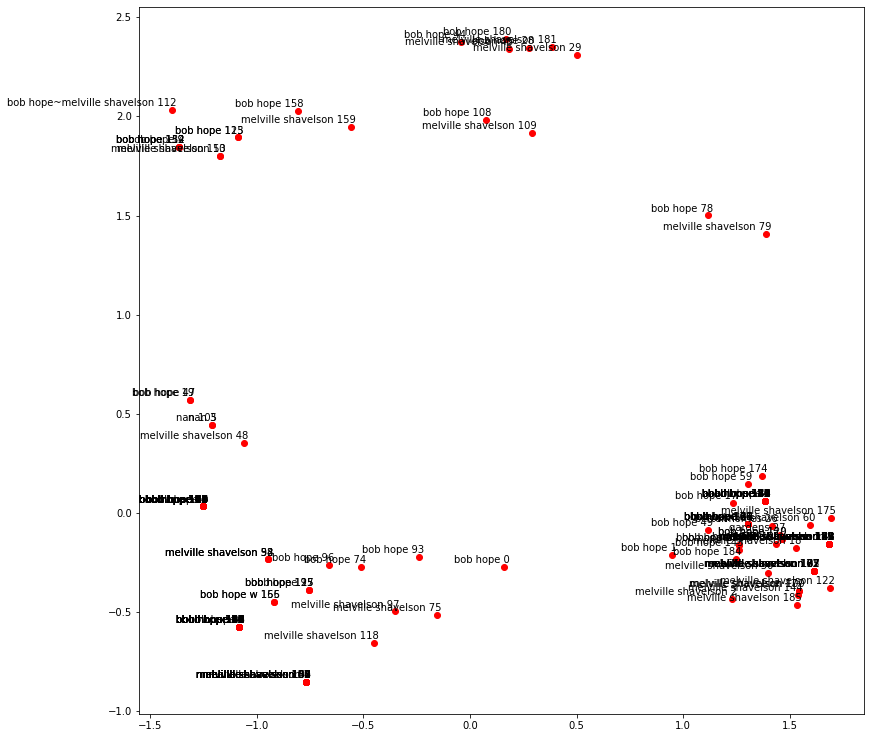

-------------------------------
cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.0021698474884033203
num of classes: 10


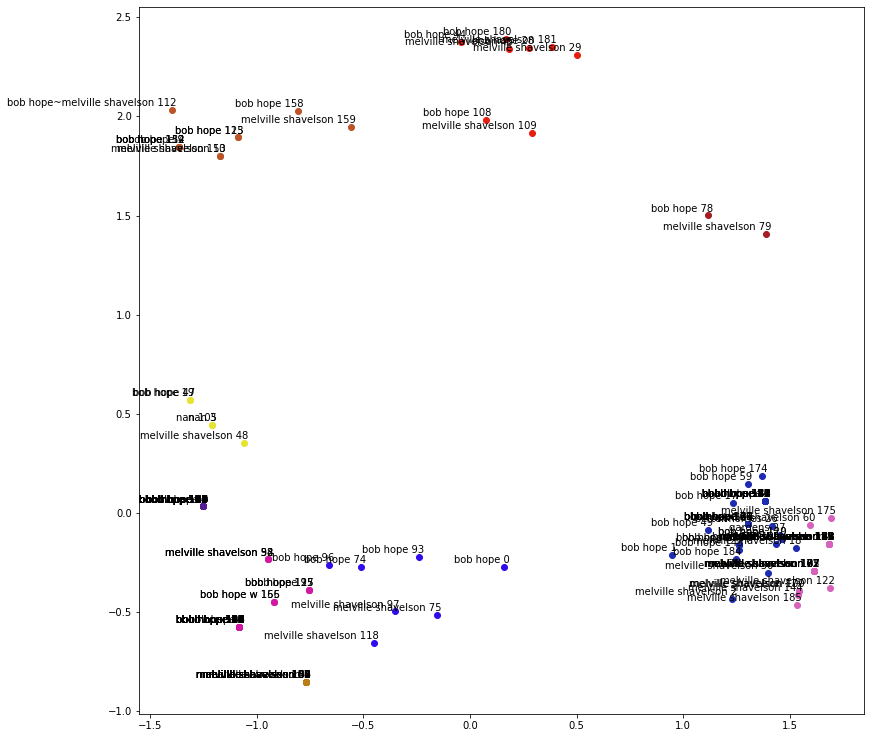

-------------------------------
lengthNecessary: 38.2
[{'better homes': 1, 'bob hope': 38, 'gardens': 1, 'melville shavelson': 3}, {'bob hope': 34, 'bob hope w': 2, 'melville shavelson': 3}]
['bob hope', 'bob hope'] VS true_author: Bob Hope, Melville Shavelson


In [20]:
for index in range(1,9):
    print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")
    print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>book number {0}<<<<<<<<<<<<<<<<<<<<<<<<".format(index+1))
    table_ISBN, list_authors, true_author = load_by_index(table_group_by_isbn, isbn_list, true_authors, index)
    print("-------------------------------")
    print("tot cases of author's name: {0}".format(len(table_ISBN['author'].value_counts())))
    print("-------------------------------")
    embeddings_tokens = sentence_embedding(table_ISBN, key_values)
    print("-------------------------------")
    pca_embeddings = dimension_reduction_algorithms(embeddings_tokens, key_values)
    plotChart(list_authors, pca_embeddings)
    print("-------------------------------")
    blocks = cluster_algorithm(pca_embeddings, key_values)
    plotCluster(blocks, list_authors, key_values['num_clusters'], pca_embeddings)
    print("-------------------------------")
    listCandidates = get_author_candidates(list_authors, blocks, key_values['block_length_thresold'] * len(pca_embeddings))
    print(listCandidates)
    print("{0} VS true_author: {1}".format(getFinalAuthors(listCandidates), true_author))

# PCA

## Using ['author','title','big_cate', 'small_cate', 'publisher']

The result obtained is less precise

In [10]:
key_values = {
    'model_type':'bilstm',
    'char_level':False,
    'model_version': 2,
    'rnn_dim':1024,
    'verbose':0,
    'attributes_list': ['author','title','big_cate', 'small_cate', 'publisher'],
    'embedding_type': 'inferSent',
    'dataset': 'merged_book-multiAuthors',
    'cluster_method': 'tsne',
    'dimension_reduction': 'pca',
    'num_components': 2,
    'cluster_method': 'hierarchy',
    'num_clusters': 10,
    'block_length_thresold': 0.2,
}

In [11]:
for index in range(0,9):
    print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")
    print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>book number {0}<<<<<<<<<<<<<<<<<<<<<<<<".format(index+1))
    table_ISBN, list_authors, true_author = load_by_index(table_group_by_isbn, isbn_list, true_authors, index)
    print("tot cases of author's name: {0}".format(len(table_ISBN['author'].value_counts())))
    embeddings_tokens = sentence_embedding(table_ISBN, key_values)
    pca_embeddings = dimension_reduction_algorithms(embeddings_tokens, key_values)
    blocks = cluster_algorithm(pca_embeddings, key_values)
    listCandidates = get_author_candidates(list_authors, blocks, key_values['block_length_thresold'] * len(pca_embeddings))
    print(listCandidates)
    print("{0} VS true_author: {1}".format(getFinalAuthors(listCandidates), true_author))

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 1<<<<<<<<<<<<<<<<<<<<<<<<
ISBN: 1878685546
true author: Alan Shepard, Deke Slayton
tot cases of author's name: 16
lengthNecessary: 90.80000000000001
[{'barbree jay': 66, 'benedict howard': 64}, {'armstrong deke neil slayton': 1, 'deke slayton': 109}, {'alan b shepard': 1, 'alan shepard': 85, 'alan shepherd': 5, 'barbree jay': 1}]
['barbree jay', 'deke slayton', 'alan shepard'] VS true_author: Alan Shepard, Deke Slayton
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 2<<<<<<<<<<<<<<<<<<<<<<<<
ISBN: 0394558588
true author: Jimmy Carter, Rosalynn Carter
tot cases of author's name: 8
lengthNecessary: 52.2
[{'carter jimmy': 75}, {'*signed carter rosalynn': 1, 'carter rosalynn': 62, 'jimmy': 3}]
['carter jimmy', 'carter rosalynn'] VS true_author: Jimmy Carter, Rosalyn

## Using ['author','title','big_cate']

In [12]:
key_values = {
    'model_type':'bilstm',
    'char_level':False,
    'model_version': 2,
    'rnn_dim':1024,
    'verbose':0,
    'attributes_list': ['author','title','big_cate'],
    'embedding_type': 'inferSent',
    'dataset': 'merged_book-multiAuthors',
    'cluster_method': 'tsne',
    'dimension_reduction': 'pca',
    'num_components': 2,
    'cluster_method': 'hierarchy',
    'num_clusters': 10,
    'block_length_thresold': 0.2,
}

In [13]:
for index in range(0,9):
    print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")
    print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>book number {0}<<<<<<<<<<<<<<<<<<<<<<<<".format(index+1))
    table_ISBN, list_authors, true_author = load_by_index(table_group_by_isbn, isbn_list, true_authors, index)
    print("tot cases of author's name: {0}".format(len(table_ISBN['author'].value_counts())))
    embeddings_tokens = sentence_embedding(table_ISBN, key_values)
    pca_embeddings = dimension_reduction_algorithms(embeddings_tokens, key_values)
    blocks = cluster_algorithm(pca_embeddings, key_values)
    listCandidates = get_author_candidates(list_authors, blocks, key_values['block_length_thresold'] * len(pca_embeddings))
    print(listCandidates)
    print("{0} VS true_author: {1}".format(getFinalAuthors(listCandidates), true_author))

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 1<<<<<<<<<<<<<<<<<<<<<<<<
ISBN: 1878685546
true author: Alan Shepard, Deke Slayton
tot cases of author's name: 16
lengthNecessary: 90.80000000000001
[{'armstrong deke neil slayton': 1, 'deke slayton': 108}, {'adams ben': 1, 'alan b shepard': 1, 'alan barbree~howard benedict shepard~deke slayton~jay': 1, 'alan shepard': 88, 'alan shepherd': 6, 'alan shpard': 1, 'barbree jay': 1, 'benedict howard': 1}]
['deke slayton', 'alan shepard'] VS true_author: Alan Shepard, Deke Slayton
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 2<<<<<<<<<<<<<<<<<<<<<<<<
ISBN: 0394558588
true author: Jimmy Carter, Rosalynn Carter
tot cases of author's name: 8
lengthNecessary: 52.2
[{'carter jimmy': 108}, {'*signed carter rosalynn': 1, 'carter rosalynn': 80}]
['carter jimmy', 'carter ro

## Using ['author','title']

In [17]:
key_values = {
    'model_type':'bilstm',
    'char_level':False,
    'model_version': 2,
    'rnn_dim':1024,
    'verbose':0,
    'attributes_list': ['author','title'],
    'embedding_type': 'inferSent',
    'dataset': 'merged_book-multiAuthors',
    'dimension_reduction': 'pca',
    'num_components': 2,
    'cluster_method': 'hierarchy',
    'num_clusters': 10,
    'block_length_thresold': 0.2,
}

In [18]:
for index in range(0,9):
    print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")
    print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>book number {0}<<<<<<<<<<<<<<<<<<<<<<<<".format(index+1))
    table_ISBN, list_authors, true_author = load_by_index(table_group_by_isbn, isbn_list, true_authors, index)
    print("tot cases of author's name: {0}".format(len(table_ISBN['author'].value_counts())))
    embeddings_tokens = sentence_embedding(table_ISBN, key_values)
    pca_embeddings = dimension_reduction_algorithms(embeddings_tokens, key_values)
    blocks = cluster_algorithm(pca_embeddings, key_values)
    listCandidates = get_author_candidates(list_authors, blocks, key_values['block_length_thresold'] * len(pca_embeddings))
    print(listCandidates)
    print("{0} VS true_author: {1}".format(getFinalAuthors(listCandidates), true_author))

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 1<<<<<<<<<<<<<<<<<<<<<<<<
ISBN: 1878685546
true author: Alan Shepard, Deke Slayton
tot cases of author's name: 16
lengthNecessary: 90.80000000000001
[{'armstrong deke neil slayton': 1, 'deke slayton': 108}, {'adams ben': 1, 'alan b shepard': 1, 'alan barbree~howard benedict shepard~deke slayton~jay': 1, 'alan shepard': 88, 'alan shepherd': 6, 'alan shpard': 1, 'barbree jay': 1, 'benedict howard': 1}]
['deke slayton', 'alan shepard'] VS true_author: Alan Shepard, Deke Slayton
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 2<<<<<<<<<<<<<<<<<<<<<<<<
ISBN: 0394558588
true author: Jimmy Carter, Rosalynn Carter
tot cases of author's name: 8
lengthNecessary: 52.2
[{'carter jimmy': 108}, {'*signed carter rosalynn': 1, 'carter rosalynn': 77}]
['carter jimmy', 'carter ro

# TSNE

## ['author','title']

In [17]:
key_values = {
    'model_type':'bilstm',
    'char_level':False,
    'model_version': 2,
    'rnn_dim':1024,
    'verbose':0,
    'attributes_list': ['author','title'],
    'embedding_type': 'inferSent',
    'dataset': 'merged_book-multiAuthors',
    'dimension_reduction': 'tsne',
    'perplexity': 10,
    'method': 'barnes_hut',
    'early_exaggeration': 12,
    'num_components': 2,
    'cluster_method': 'hierarchy',
    'num_clusters': 10,
    'block_length_thresold': 0.1, #<--- less
}

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 1<<<<<<<<<<<<<<<<<<<<<<<<
tot cases of author's name: 16
starting dimension: 2048
rows: 454
classes: 454


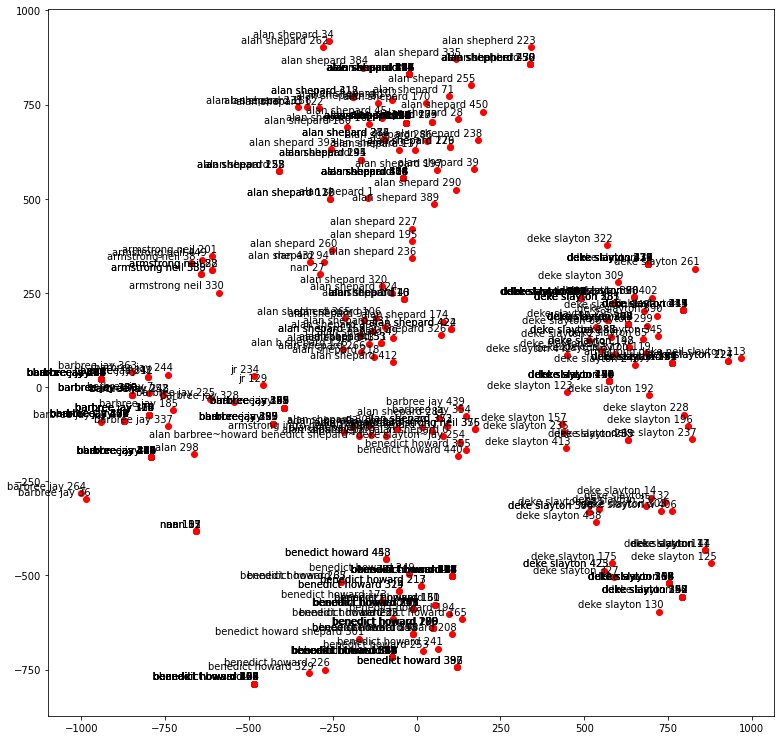

num of classes: 10


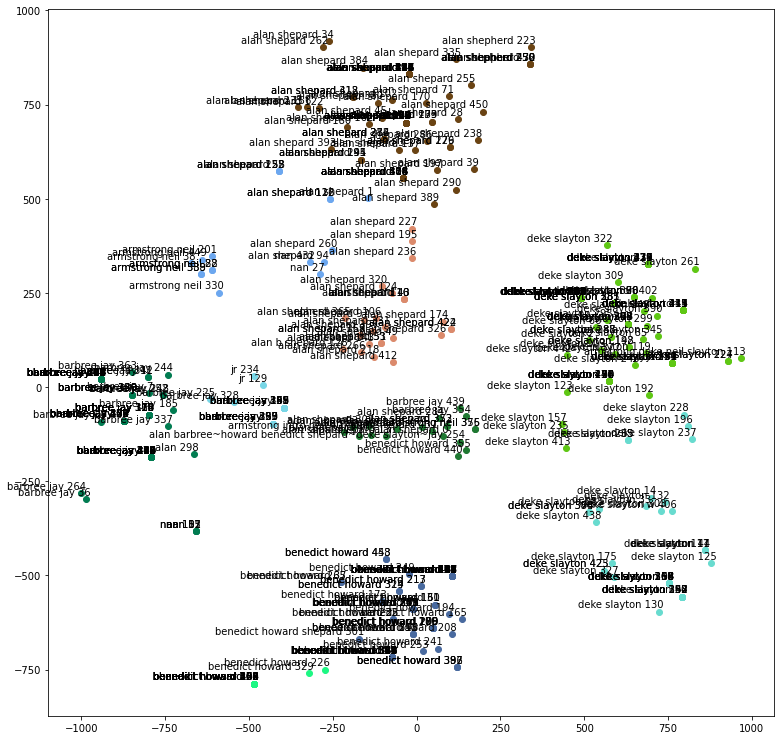

[{'armstrong deke neil slayton': 1, 'deke slayton': 86}, {'alan b shepard': 1, 'alan shepard': 79, 'alan shepherd': 5}, {'alan': 1, 'barbree jay': 72, 'nan': 4}, {'benedict howard': 70, 'benedict howard shepard': 1}]
['deke slayton', 'alan shepard', 'barbree jay', 'benedict howard'] VS true_author: Alan Shepard, Deke Slayton
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 2<<<<<<<<<<<<<<<<<<<<<<<<
tot cases of author's name: 8
starting dimension: 2048
rows: 261
classes: 261


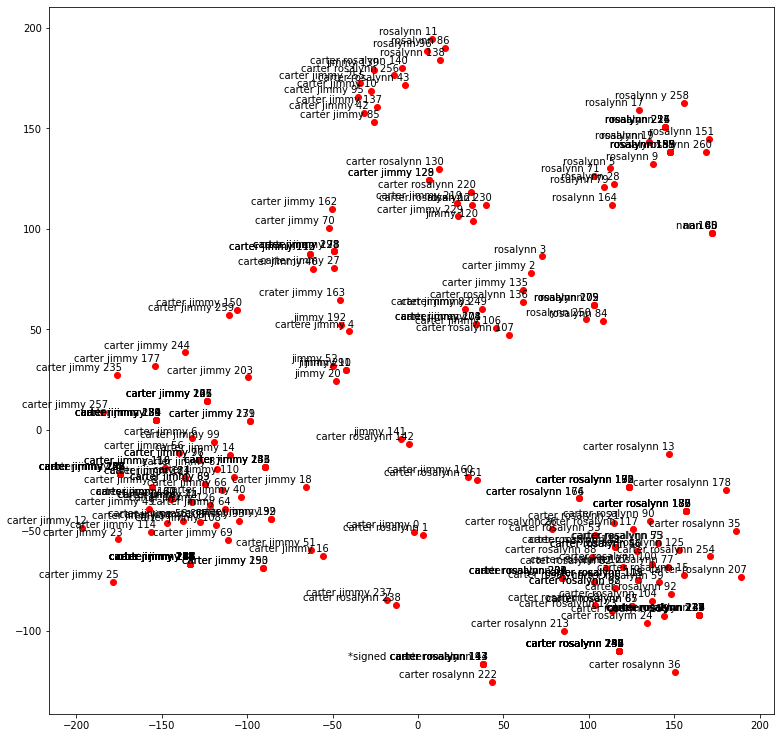

num of classes: 10


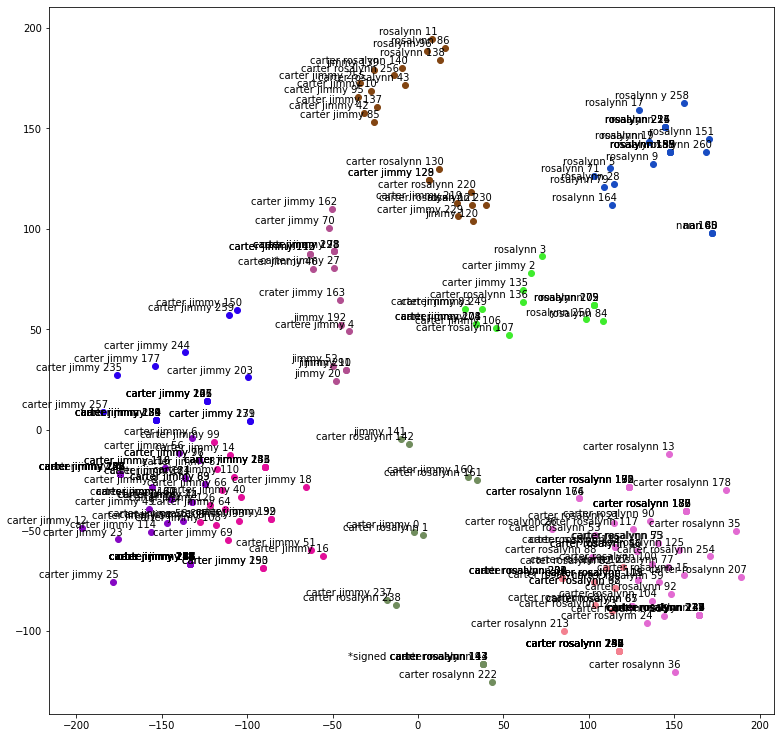

[{'carter jimmy': 54}, {'carter rosalynn': 51}]
['carter jimmy', 'carter rosalynn'] VS true_author: Jimmy Carter, Rosalynn Carter
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 3<<<<<<<<<<<<<<<<<<<<<<<<
tot cases of author's name: 29
starting dimension: 2048
rows: 472
classes: 472


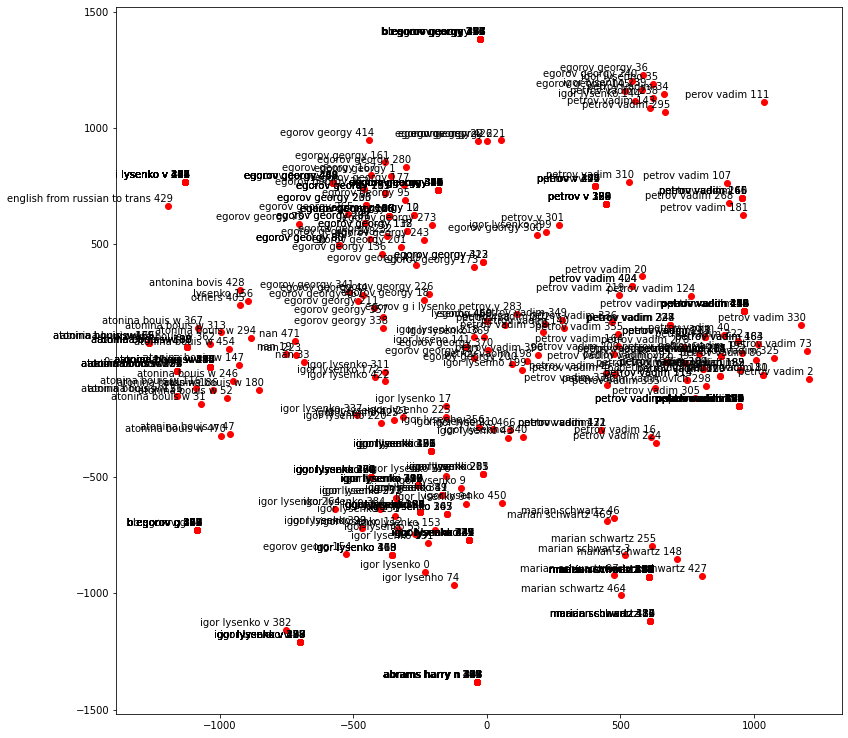

num of classes: 10


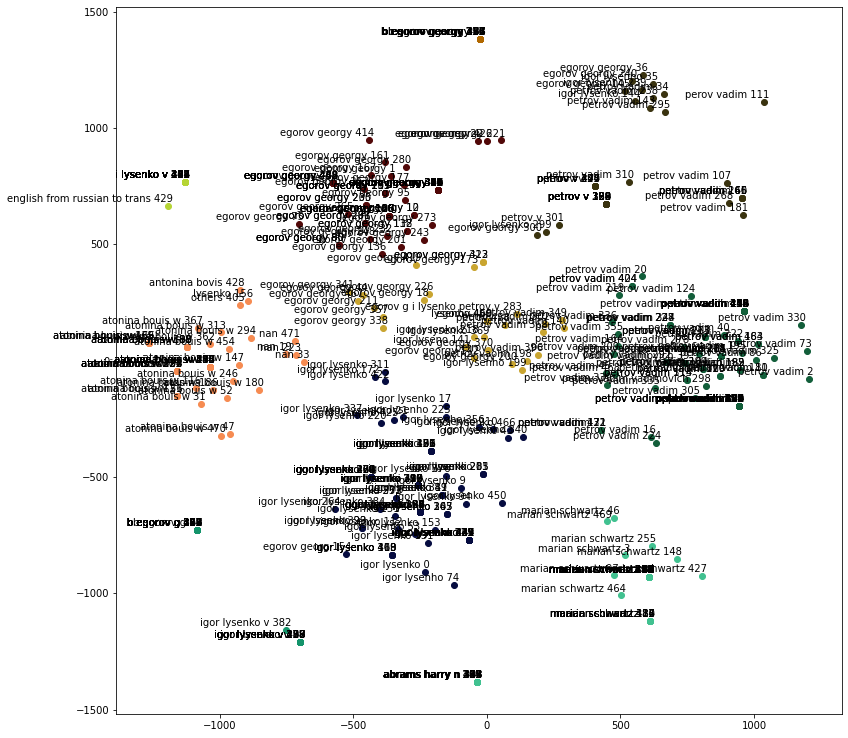

[{'petrov vadim': 91, 'petrov vadim vadimovich': 10}, {'egorov georg': 1, 'igor lysenho': 7, 'igor lysenkho': 1, 'igor lysenki': 6, 'igor lysenko': 69}, {'egorov georgy': 71}, {'abrams harry n': 11, 'marian schwartz': 41}]
['petrov vadim', 'igor lysenko', 'egorov georgy', 'marian schwartz'] VS true_author: Vadim Petrov, Igor Lysenho, Georgy Egorgy
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 4<<<<<<<<<<<<<<<<<<<<<<<<
tot cases of author's name: 9
starting dimension: 2048
rows: 247
classes: 247


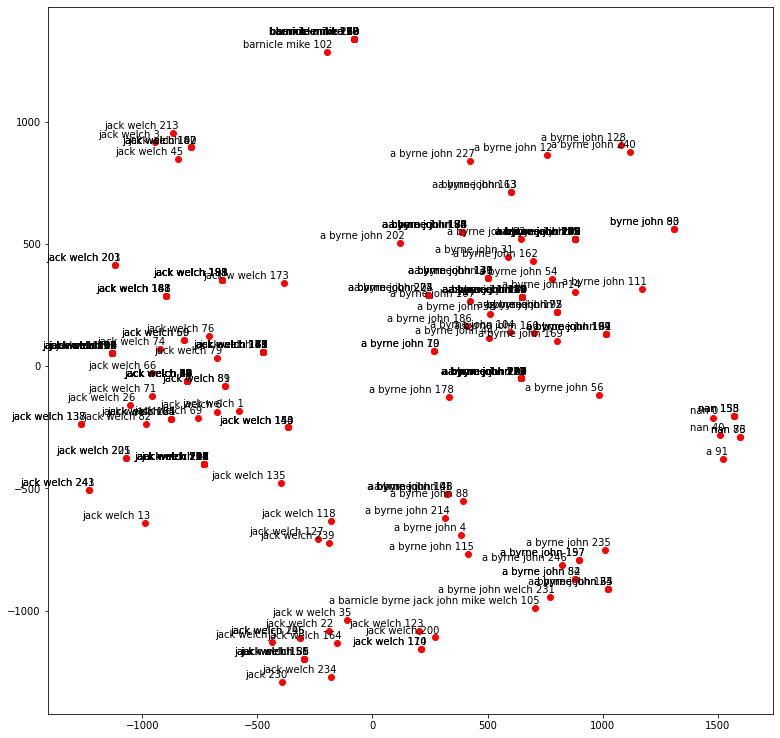

num of classes: 10


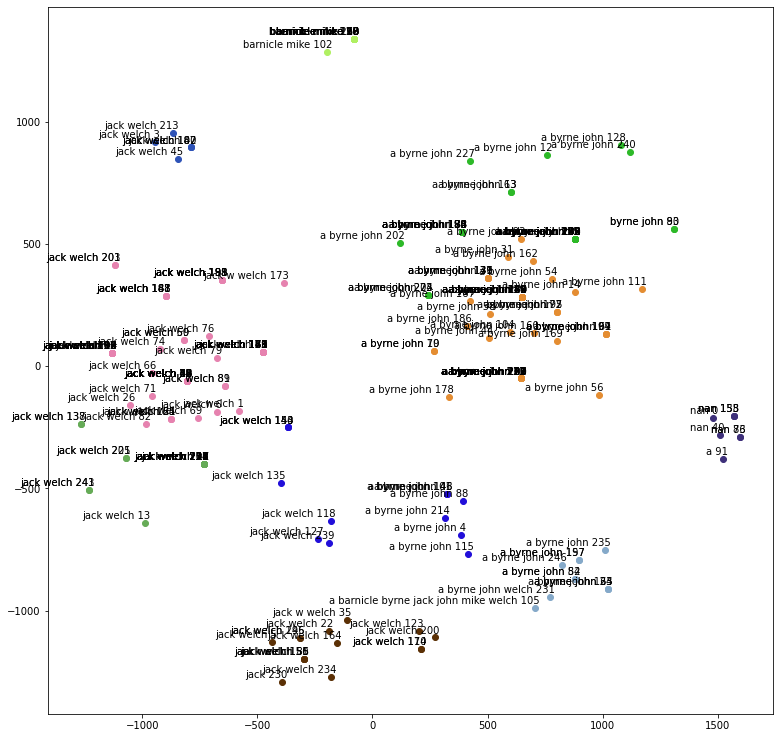

[{'jack w welch': 1, 'jack welch': 68}, {'a byrne john': 55}, {'a byrne john': 32, 'byrne john': 2}]
['jack welch', 'a byrne john', 'a byrne john'] VS true_author: Jack Welch, John A. Byrne
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 5<<<<<<<<<<<<<<<<<<<<<<<<
tot cases of author's name: 9
starting dimension: 2048
rows: 319
classes: 319


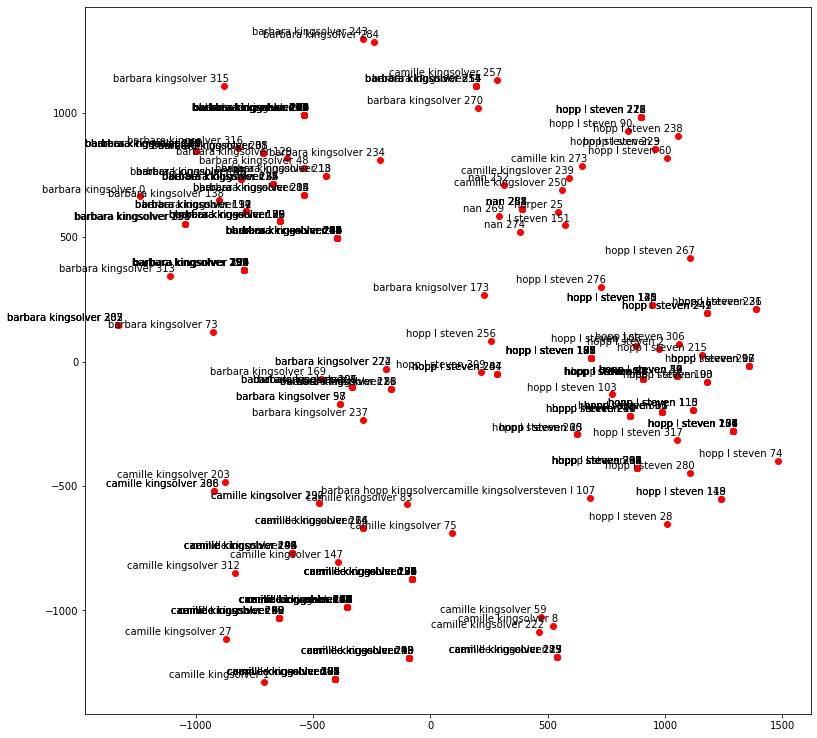

num of classes: 10


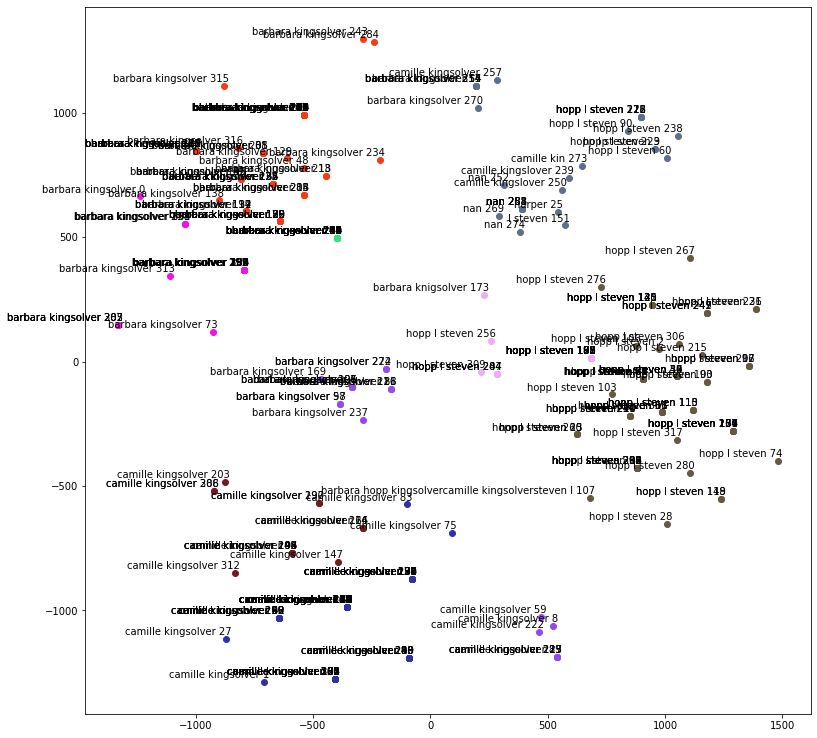

[{'barbara hopp kingsolvercamille kingsolversteven l': 1, 'hopp l steven': 70}, {'camille kingsolver': 69}, {'barbara kingsolver': 63}]
['hopp l steven', 'camille kingsolver', 'barbara kingsolver'] VS true_author: Barbara Kingsolver, Steven L. Hopp, Camille Kingsolver
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 6<<<<<<<<<<<<<<<<<<<<<<<<
tot cases of author's name: 9
starting dimension: 2048
rows: 226
classes: 226


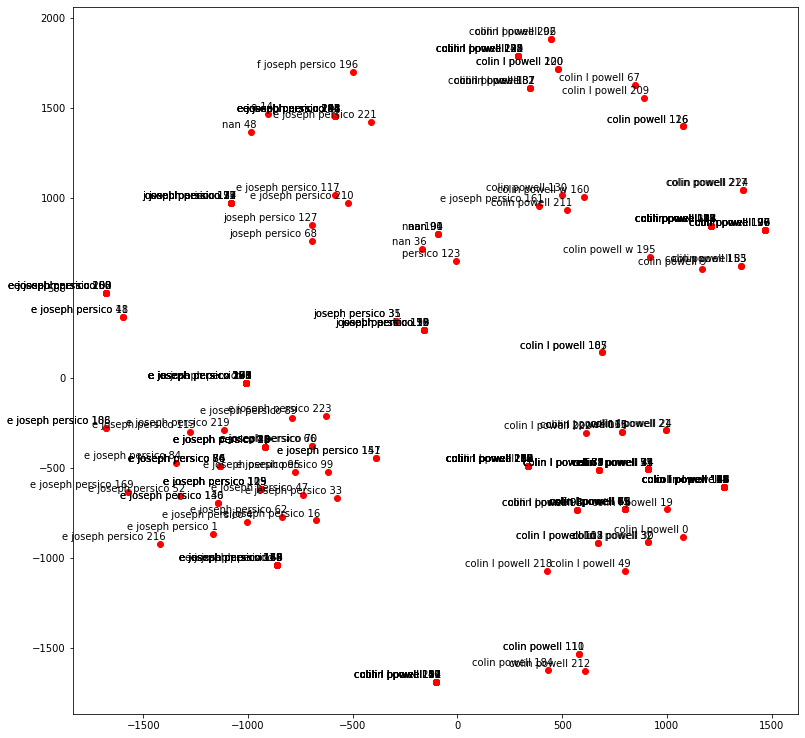

num of classes: 10


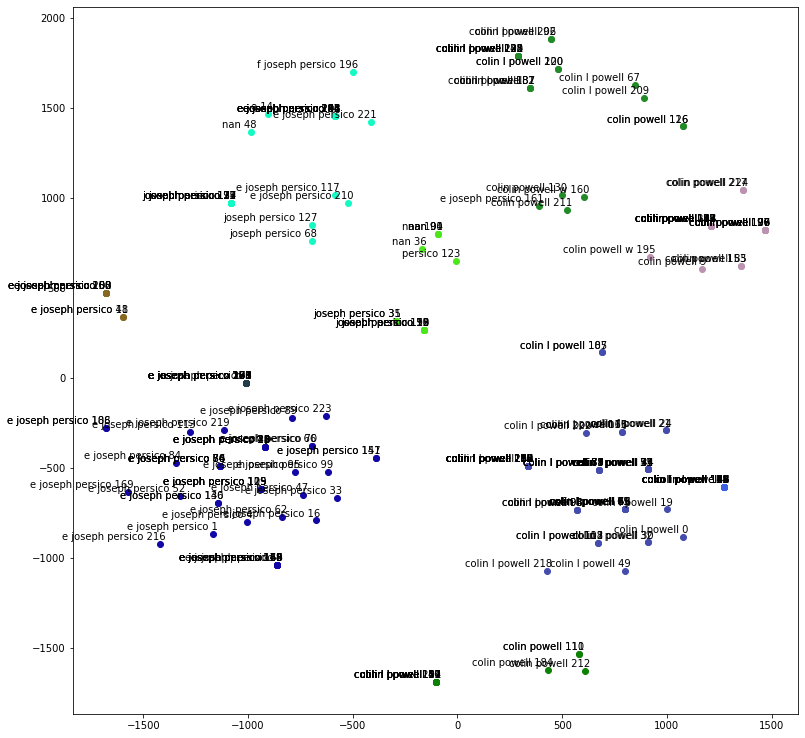

[{'colin l powell': 49}, {'e joseph persico': 46}, {'e': 1, 'e joseph persico': 13, 'f joseph persico': 1, 'joseph perisco': 1, 'joseph persico': 8, 'nan': 1}, {'colin powell': 23, 'colin powell w': 1}]
['colin l powell', 'e joseph persico', 'e joseph persico', 'colin powell'] VS true_author: Colin Powell, Joseph E. Persico
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 7<<<<<<<<<<<<<<<<<<<<<<<<
tot cases of author's name: 14
starting dimension: 2048
rows: 320
classes: 320


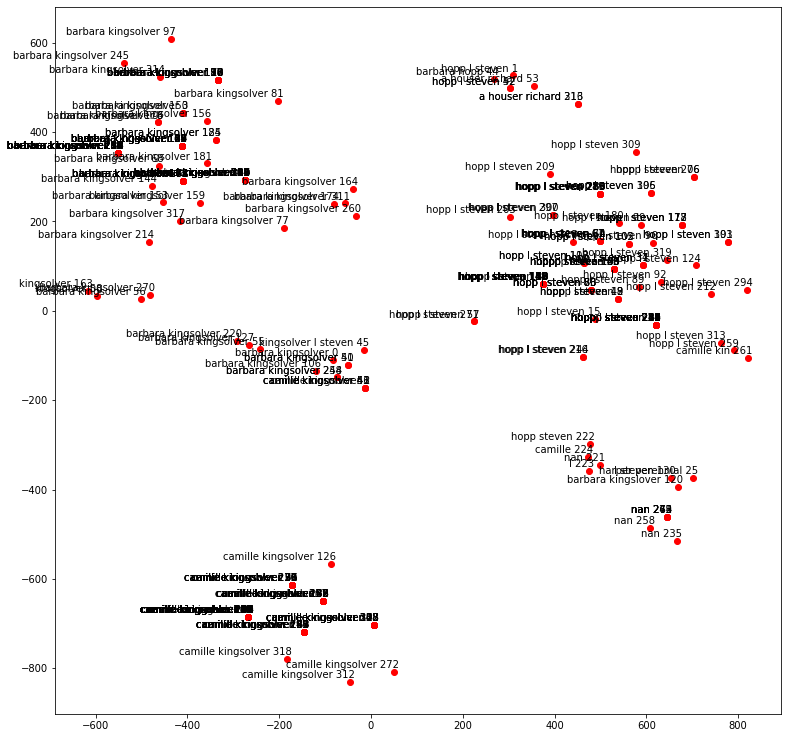

num of classes: 10


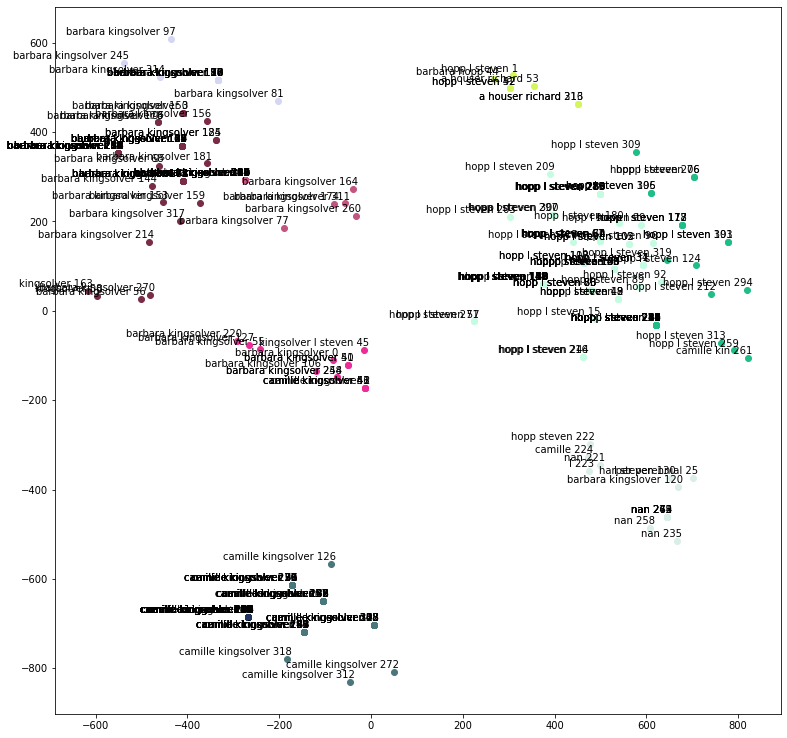

[{'barbara kingsolver': 64, 'kingsolver': 2}, {'hopp l steven': 58}, {'camille kingsolver': 44}, {'camille kingsolver': 43}, {'camille kin': 1, 'hopp l steven': 31}]
['barbara kingsolver', 'hopp l steven', 'camille kingsolver', 'camille kingsolver', 'hopp l steven'] VS true_author: Barbara Kingsolver, Steven L. Hopp, Camille Kingsolver
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 8<<<<<<<<<<<<<<<<<<<<<<<<
tot cases of author's name: 14
starting dimension: 2048
rows: 228
classes: 228


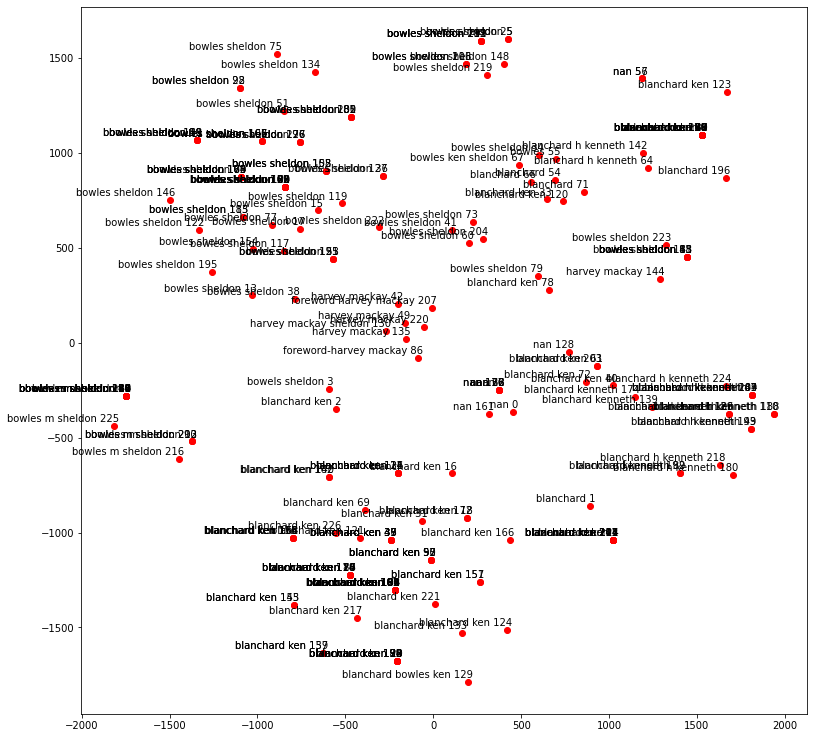

num of classes: 10


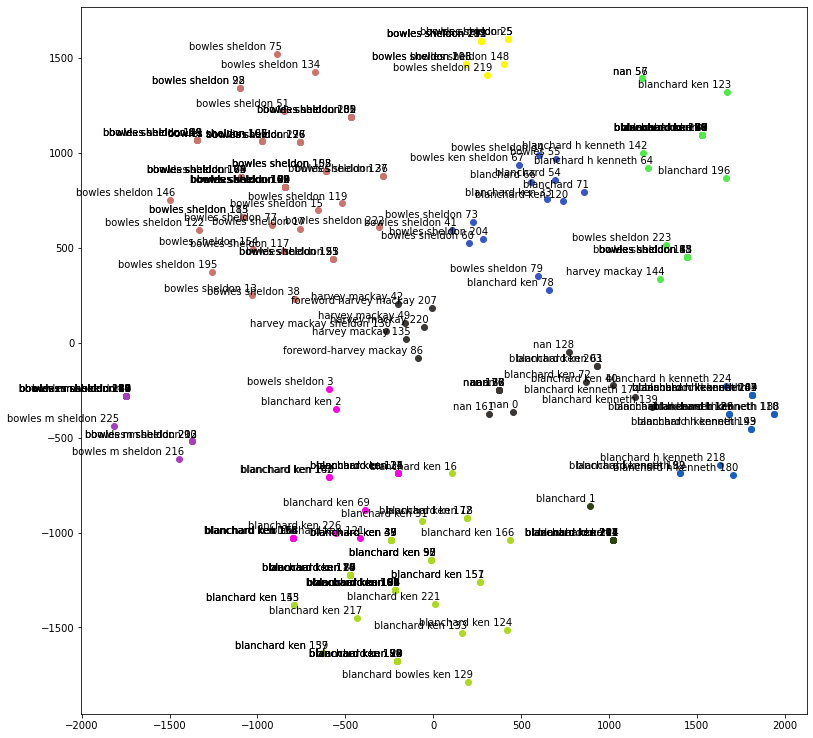

[{'bowles sheldon': 55}, {'blanchard bowles ken': 1, 'blanchard ken': 48}, {'blanchard': 1, 'blanchard h kenneth': 2, 'blanchard ken': 13, 'bowles sheldon': 6, 'harvey mackay': 1, 'nan': 2}]
['bowles sheldon', 'blanchard ken', 'blanchard ken'] VS true_author: Ken Blanchard, Sheldon Bowles
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 9<<<<<<<<<<<<<<<<<<<<<<<<
tot cases of author's name: 6
starting dimension: 2048
rows: 191
classes: 191


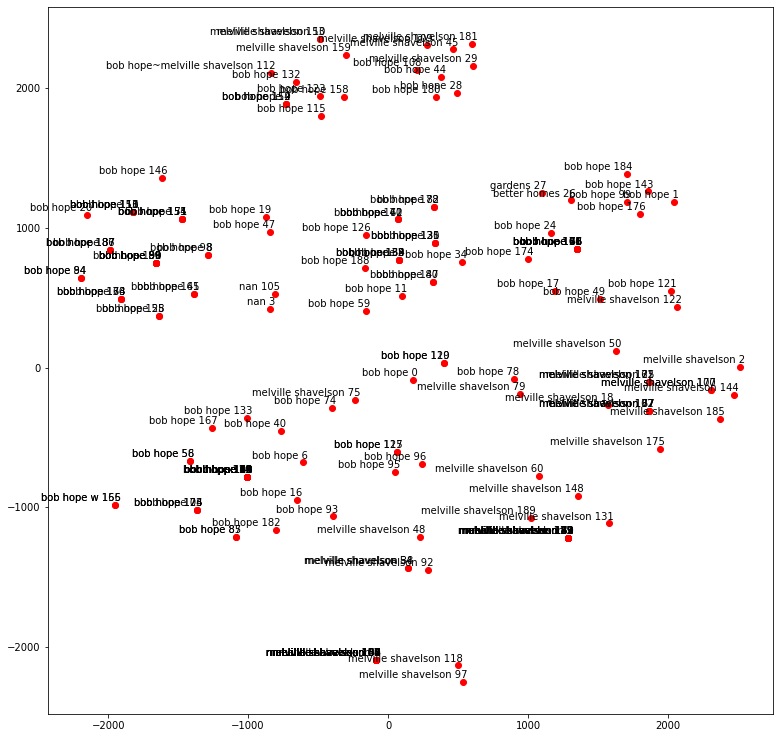

num of classes: 10


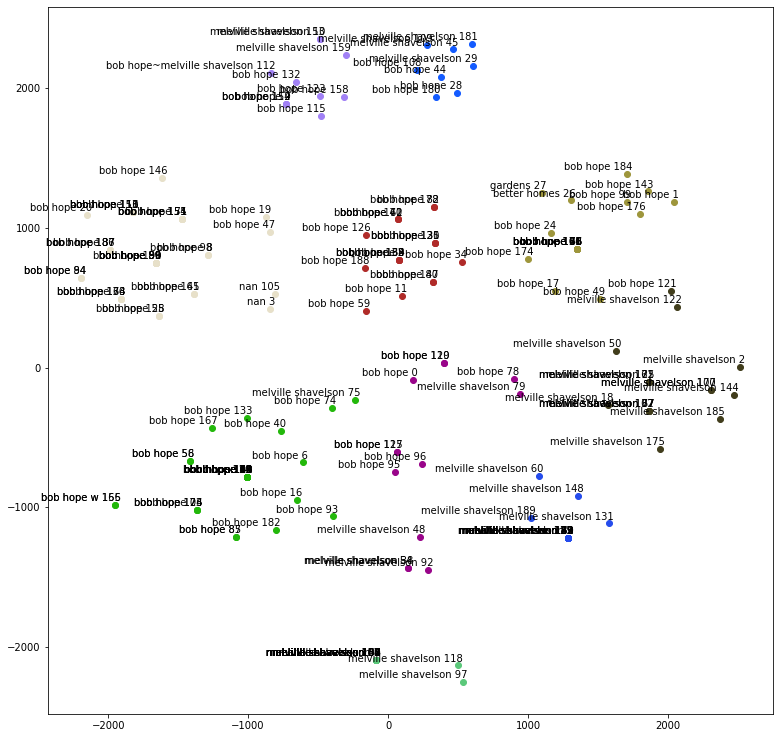

[{'bob hope': 33, 'bob hope w': 2, 'melville shavelson': 1}, {'bob hope': 32, 'nan': 2}]
['bob hope', 'bob hope'] VS true_author: Bob Hope, Melville Shavelson


In [18]:
for index in range(0,9):
    print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")
    print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>book number {0}<<<<<<<<<<<<<<<<<<<<<<<<".format(index+1))
    table_ISBN, list_authors, true_author = load_by_index(table_group_by_isbn, isbn_list, true_authors, index, key_values['verbose'])
    print("tot cases of author's name: {0}".format(len(table_ISBN['author'].value_counts())))
    embeddings_tokens = sentence_embedding(table_ISBN, key_values)
    tsne_embeddings = dimension_reduction_algorithms(embeddings_tokens, key_values)
    plotChart(list_authors, tsne_embeddings)
    blocks = cluster_algorithm(tsne_embeddings, key_values)
    plotCluster(blocks, list_authors, key_values['num_clusters'], tsne_embeddings)    
    listCandidates = get_author_candidates(list_authors, blocks, key_values['block_length_thresold'] * len(tsne_embeddings), key_values['verbose'])
    print(listCandidates)
    print("{0} VS true_author: {1}".format(getFinalAuthors(listCandidates), true_author))

## ['author','title','big_cate']

In [19]:
key_values = {
    'model_type':'bilstm',
    'char_level':False,
    'model_version': 2,
    'rnn_dim':1024,
    'verbose':1,
    'attributes_list': ['author','title', 'big_cate'],
    'embedding_type': 'inferSent',
    'dataset': 'merged_book-multiAuthors',
    'dimension_reduction': 'tsne',
    'perplexity': 10,
    'method': 'barnes_hut',
    'early_exaggeration': 12,
    'num_components': 2,
    'cluster_method': 'hierarchy',
    'num_clusters': 10,
    'block_length_thresold': 0.15, #<--- less
}

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 1<<<<<<<<<<<<<<<<<<<<<<<<
ISBN: 1878685546
true author: Alan Shepard, Deke Slayton
tot cases of author's name: 16
embedding_type: inferSent
attributes_list: ['author', 'title', 'big_cate']
model_type: bilstm
char_level: False
Embedding time is: 4.807581186294556
dimension_reduction: tsne
num_components: 2
perplexity: 10
early_exaggeration: 12
method: barnes_hut
starting dimension: 2048
Dimension reduction time is: 7.85187292098999
rows: 454
classes: 454


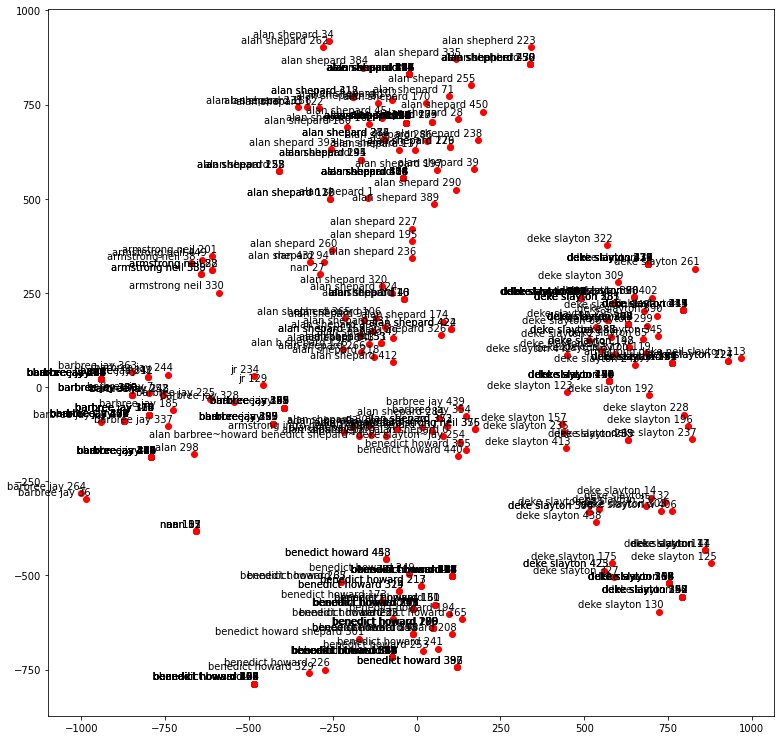

cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.007627010345458984
num of classes: 10


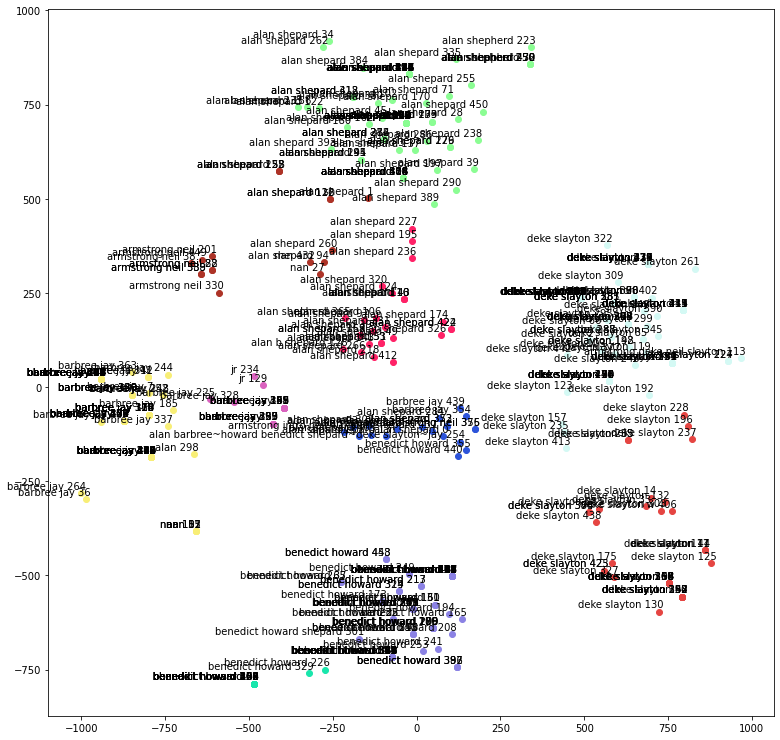

Discarted candidate: [{'deke slayton': 35, 'deke slayton w': 1}, {'alan b shepard': 1, 'alan shepard': 25, 'alan shepherd': 1}, {'adams ben': 1, 'alan barbree~howard benedict shepard~deke slayton~jay': 1, 'alan shepard': 11, 'alan shpard': 1, 'armstrong intro neil': 1, 'armstrong neil': 2, 'barbree jay': 2, 'benedict howard': 2}, {'alan shepard': 8, 'armstrong neil': 8, 'nan': 2}, {'barbree jay': 15, 'jr': 2}, {'benedict howard': 15}]
Possible candidate: [{'armstrong deke neil slayton': 1, 'deke slayton': 86}, {'alan b shepard': 1, 'alan shepard': 79, 'alan shepherd': 5}, {'alan': 1, 'barbree jay': 72, 'nan': 4}, {'benedict howard': 70, 'benedict howard shepard': 1}]
lengthNecessary: 68.1
[{'armstrong deke neil slayton': 1, 'deke slayton': 86}, {'alan b shepard': 1, 'alan shepard': 79, 'alan shepherd': 5}, {'alan': 1, 'barbree jay': 72, 'nan': 4}, {'benedict howard': 70, 'benedict howard shepard': 1}]
['deke slayton', 'alan shepard', 'barbree jay', 'benedict howard'] VS true_author: Al

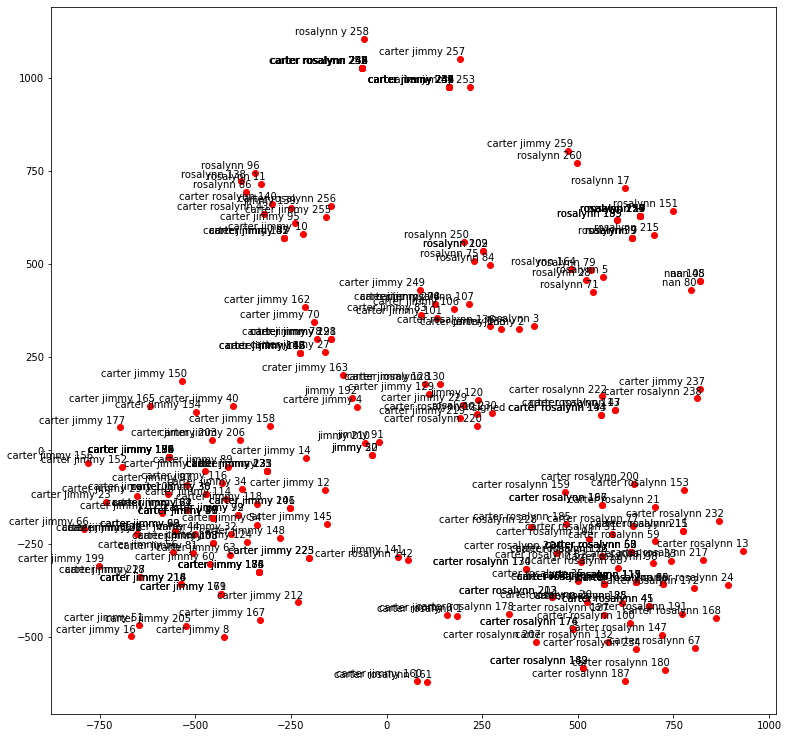

cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.0050432682037353516
num of classes: 10


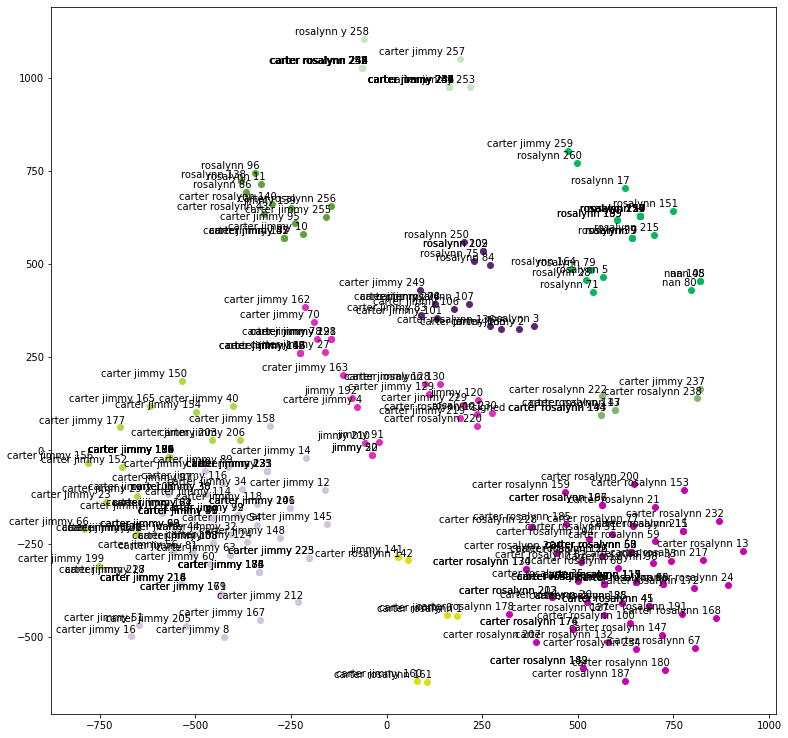

Discarted candidate: [{'carter jimmy': 13, 'carter rosalynn': 3, 'cartere jimmy': 1, 'crater jimmy': 1, 'jimmy': 6, 'rosalynn': 1}, {'carter jimmy': 1, 'nan': 3, 'rosalynn': 20}, {'carter jimmy': 23}, {'carter jimmy': 10, 'carter rosalynn': 7, 'rosalynn y': 1}, {'carter jimmy': 8, 'carter rosalynn': 2, 'rosalynn': 6}, {'carter jimmy': 6, 'carter rosalynn': 3, 'jimmy': 1, 'rosalynn': 4}, {'*signed carter rosalynn': 1, 'carter jimmy': 1, 'carter rosalynn': 5}, {'carter jimmy': 2, 'carter rosalynn': 3, 'jimmy': 1}]
Possible candidate: [{'carter rosalynn': 66}, {'carter jimmy': 62}]
lengthNecessary: 39.15
[{'carter rosalynn': 66}, {'carter jimmy': 62}]
['carter rosalynn', 'carter jimmy'] VS true_author: Jimmy Carter, Rosalynn Carter
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 3<<<<<<<<<<<<<<<<<<<<<<<<
ISBN: 0810932776
true author: Vadim Petrov, Igor Lysenho, Georgy Egorgy
tot cases of author's nam

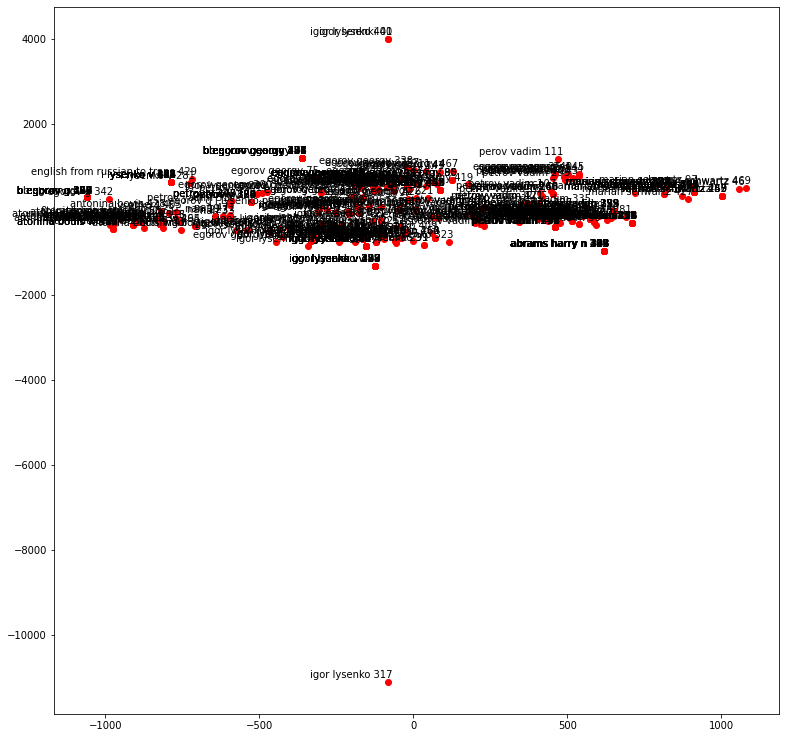

cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.008626937866210938
num of classes: 10


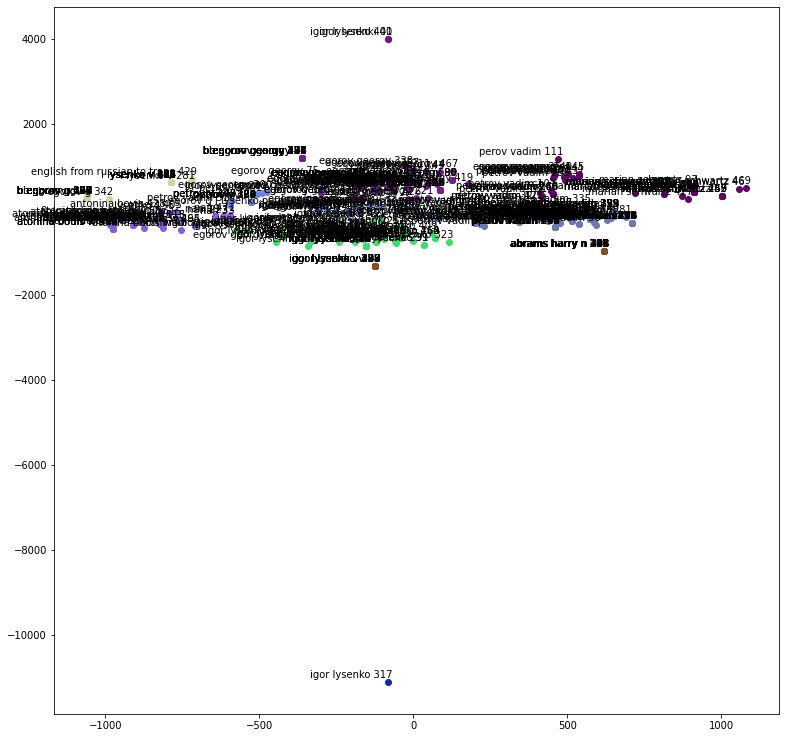

Discarted candidate: [{'egorov georgy': 3, 'igor lysenho': 2, 'igor lysenko': 1, 'marian schwartz': 41, 'perov vadim': 1, 'petrov vadim': 22}, {'antonina bovis': 1, 'atonina bouis w': 38, 'lysenko': 1, 'nan': 4, 'others': 1}, {'egorov': 1, 'egorov g i lysenko petrov v': 1, 'egorov georgy': 3, 'egoroy georgy': 1, 'igor lysenho': 1, 'igor lysenko': 3, 'igor lyseno': 1, 'lysenho': 1, 'petrov': 1, 'petrov v': 15, 'petrov vadim': 5, 'petrov vaoim': 1, 'petrov yadim': 1}, {'b egorov g': 16, 'english from russian to trans': 1, 'i lysenko v': 13}, {'abrams harry n': 11, 'igor lysenko v': 11}, {'igor lysenki': 1, 'igor lysenko': 1}, {'igor lysenko': 1}]
Possible candidate: [{'b egorov georgy': 12, 'egorov georgy': 83}, {'petrov vadim': 80, 'petrov vadim vadimovich': 10}, {'atonina bouis w': 1, 'egorov georg': 1, 'igor lysenho': 7, 'igor lysenkho': 1, 'igor lysenki': 5, 'igor lysenko': 67}]
lengthNecessary: 70.8
[{'b egorov georgy': 12, 'egorov georgy': 83}, {'petrov vadim': 80, 'petrov vadim va

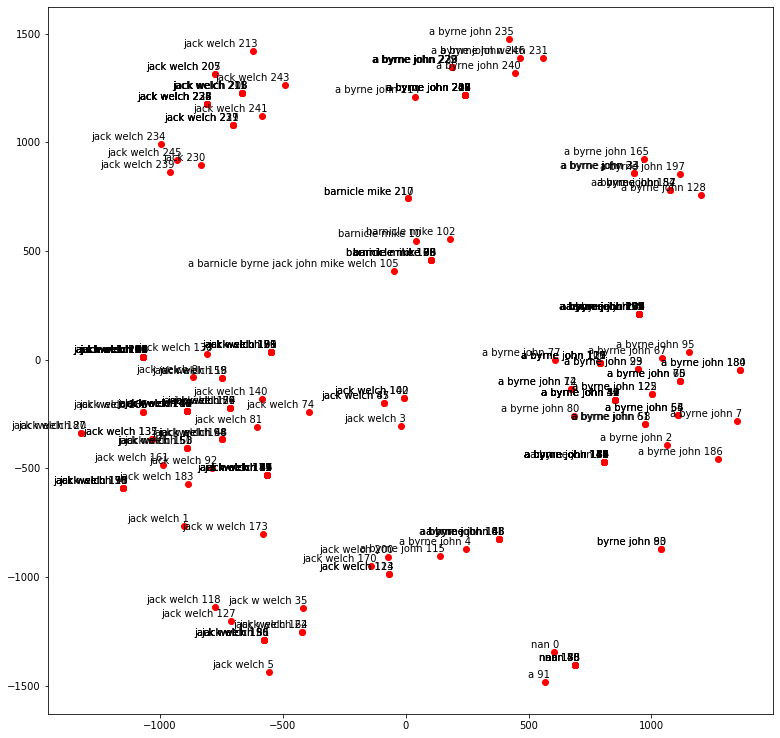

cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.0045931339263916016
num of classes: 10


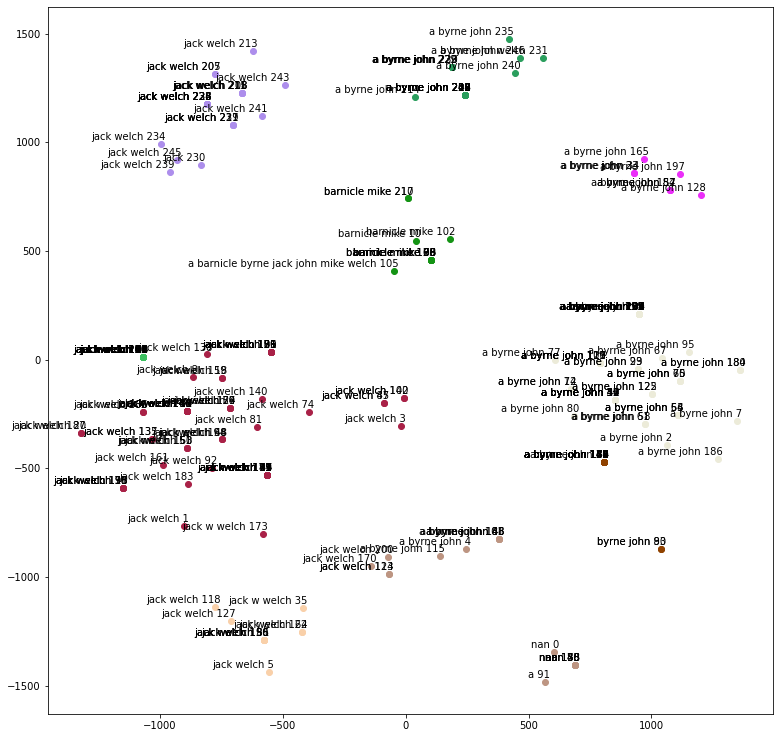

Discarted candidate: [{'a byrne john': 20, 'byrne john': 2}, {'jack': 1, 'jack welch': 21}, {'jack welch': 20}, {'a': 1, 'a byrne john': 6, 'jack welch': 4, 'nan': 7}, {'a byrne john': 17, 'a byrne john welch': 1}, {'jack w welch': 1, 'jack welch': 10}, {'a barnicle byrne jack john mike welch': 1, 'barnicle mike': 10}, {'a byrne john': 8}]
Possible candidate: [{'jack w welch': 1, 'jack welch': 64}, {'a byrne john': 52}]
lengthNecessary: 37.05
[{'jack w welch': 1, 'jack welch': 64}, {'a byrne john': 52}]
['jack welch', 'a byrne john'] VS true_author: Jack Welch, John A. Byrne
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 5<<<<<<<<<<<<<<<<<<<<<<<<
ISBN: 0060852550
true author: Barbara Kingsolver, Steven L. Hopp, Camille Kingsolver
tot cases of author's name: 9
embedding_type: inferSent
attributes_list: ['author', 'title', 'big_cate']
model_type: bilstm
char_level: False
Embedding time is: 2.295101

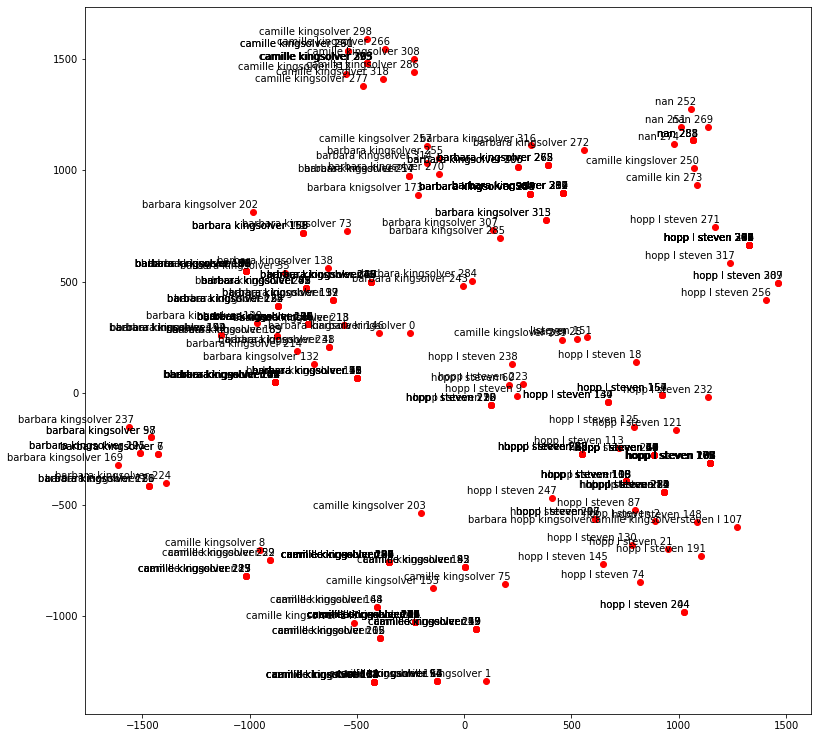

cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.004497051239013672
num of classes: 10


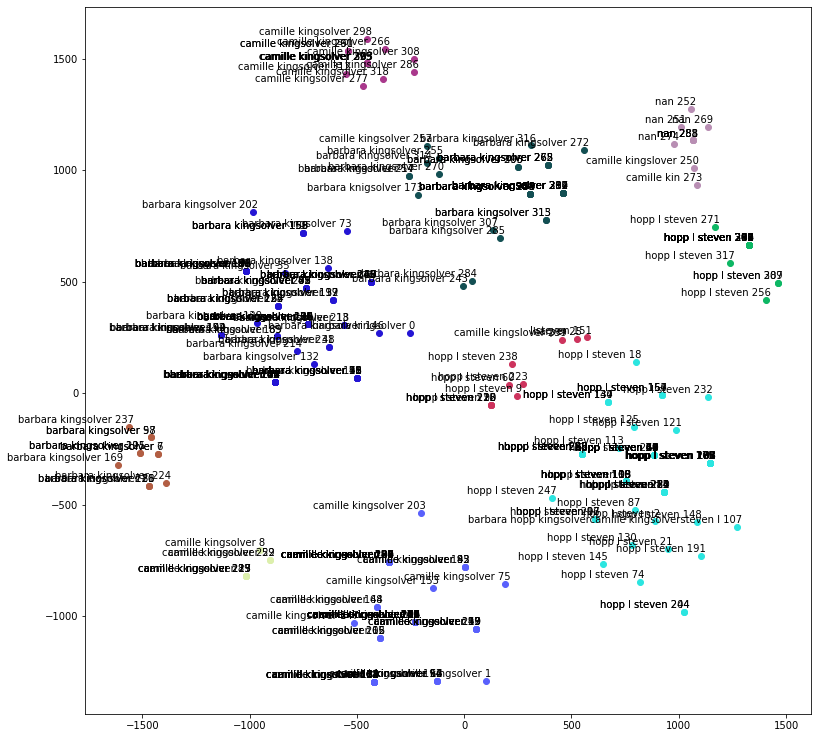

Discarted candidate: [{'barbara kingsolver': 32, 'barbara knigsolver': 1, 'camille kingsolver': 1}, {'hopp l steven': 17}, {'camille kingsolver': 14}, {'barbara kingsolver': 12}, {'camille kingslover': 1, 'harper': 1, 'hopp l steven': 8, 'l steven': 1}, {'camille kin': 1, 'camille kingslover': 1, 'nan': 8}, {'camille kingsolver': 7}]
Possible candidate: [{'barbara kingsolver': 74}, {'camille kingsolver': 70}, {'barbara hopp kingsolvercamille kingsolversteven l': 1, 'hopp l steven': 69}]
lengthNecessary: 47.85
[{'barbara kingsolver': 74}, {'camille kingsolver': 70}, {'barbara hopp kingsolvercamille kingsolversteven l': 1, 'hopp l steven': 69}]
['barbara kingsolver', 'camille kingsolver', 'hopp l steven'] VS true_author: Barbara Kingsolver, Steven L. Hopp, Camille Kingsolver
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 6<<<<<<<<<<<<<<<<<<<<<<<<
ISBN: 0679432965
true author: Colin Powell, Joseph E

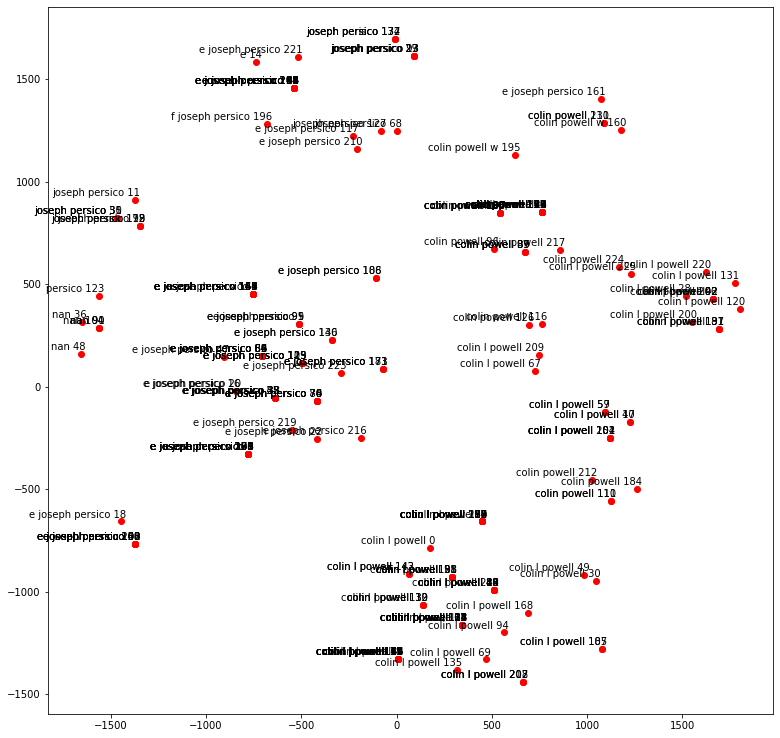

cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.002276897430419922
num of classes: 10


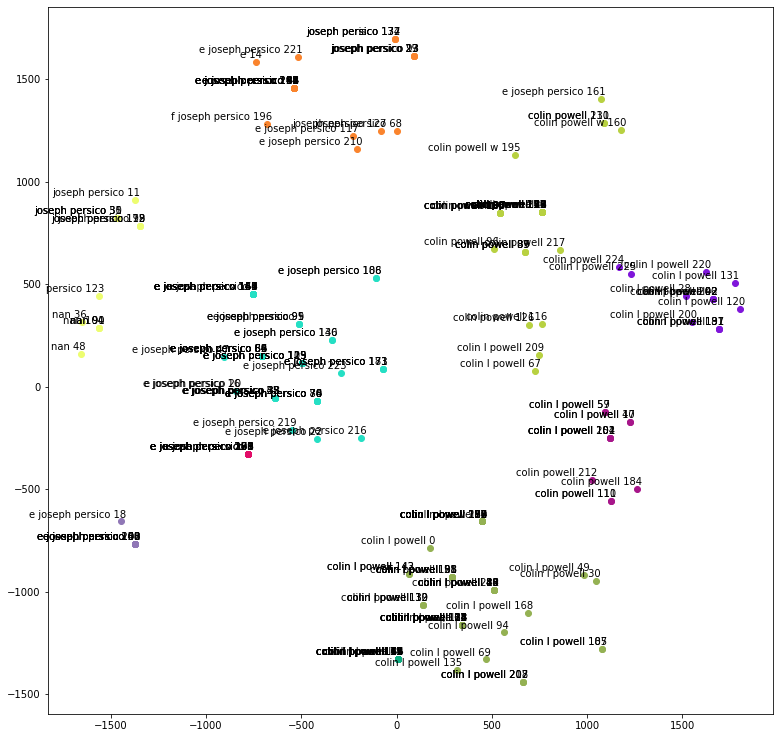

Discarted candidate: [{'colin l powell': 2, 'colin powell': 26, 'colin powell w': 2, 'e joseph persico': 1}, {'e': 1, 'e joseph persico': 13, 'f joseph persico': 1, 'joseph perisco': 1, 'joseph persico': 8}, {'colin l powell': 16}, {'colin l powell': 13, 'colin powell': 1}, {'joseph persico': 7, 'nan': 5, 'persico': 1}, {'colin l powell': 8, 'colin powell': 4}, {'e joseph persico': 10}, {'e joseph persico': 8}]
Possible candidate: [{'colin l powell': 50}, {'e joseph persico': 48}]
lengthNecessary: 33.9
[{'colin l powell': 50}, {'e joseph persico': 48}]
['colin l powell', 'e joseph persico'] VS true_author: Colin Powell, Joseph E. Persico
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 7<<<<<<<<<<<<<<<<<<<<<<<<
ISBN: 0060852569
true author: Barbara Kingsolver, Steven L. Hopp, Camille Kingsolver
tot cases of author's name: 14
embedding_type: inferSent
attributes_list: ['author', 'title', 'big_cate']

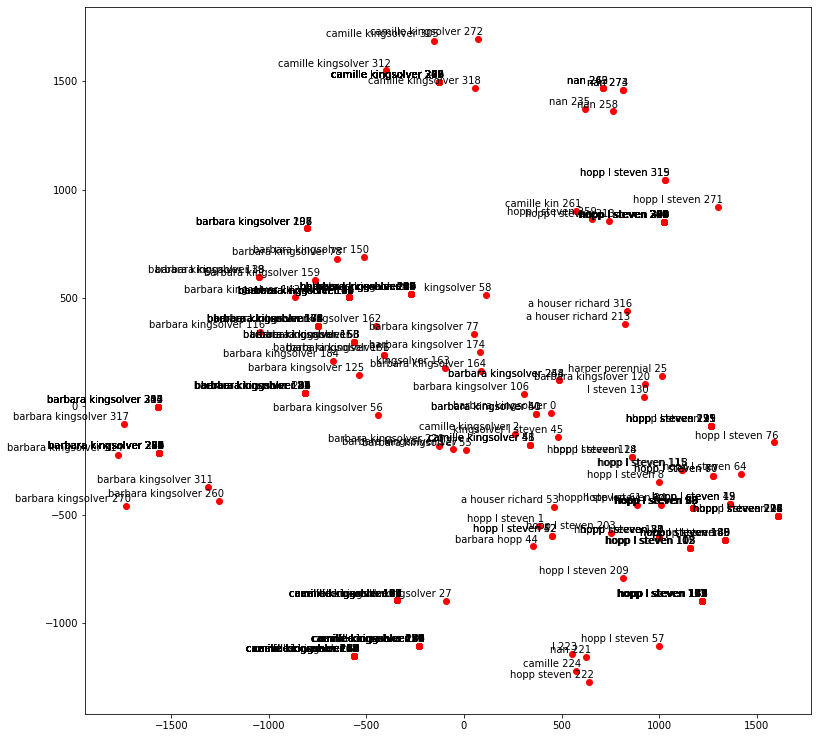

cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.005294084548950195
num of classes: 10


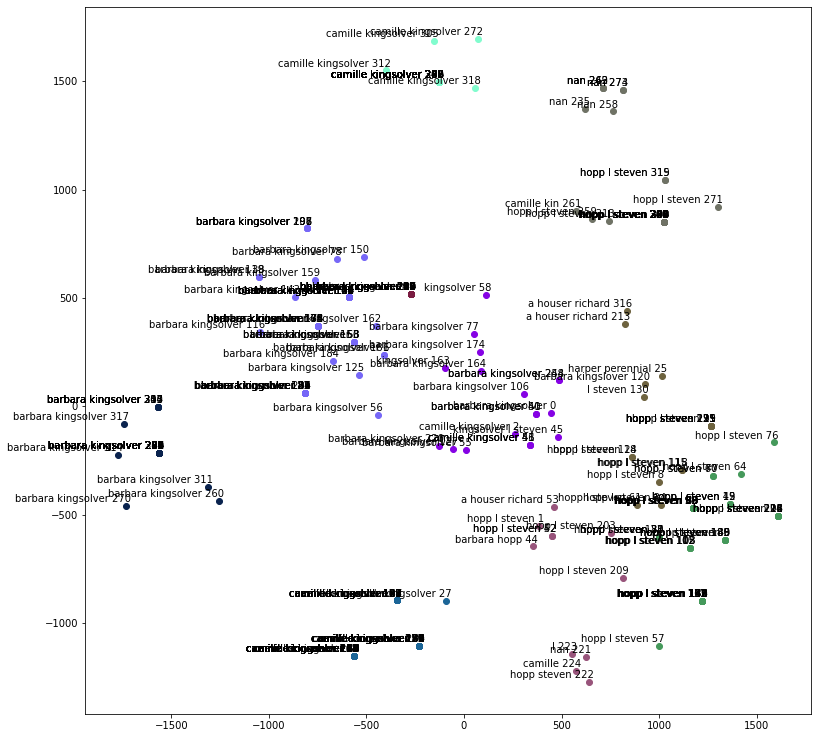

Discarted candidate: [{'camille kin': 1, 'hopp l steven': 25, 'nan': 7}, {'barbara kingsolver': 29}, {'barbara kingsolver': 26}, {'camille kingsolver': 23}, {'barbara kingsolver': 12, 'camille kingsolver': 4, 'kingsolver': 2, 'kingsolver l steven': 1}, {'a houser richard': 2, 'barbara kingslover': 1, 'harper perennial': 1, 'hopp l steven': 13, 'l steven': 1}, {'a houser richard': 1, 'barbara hopp': 1, 'camille': 1, 'hopp l steven': 5, 'hopp steven': 1, 'l': 1, 'nan': 1}]
Possible candidate: [{'camille kingsolver': 64}, {'hopp l steven': 49}, {'barbara kingsolver': 48}]
lengthNecessary: 48.0
[{'camille kingsolver': 64}, {'hopp l steven': 49}, {'barbara kingsolver': 48}]
['camille kingsolver', 'hopp l steven', 'barbara kingsolver'] VS true_author: Barbara Kingsolver, Steven L. Hopp, Camille Kingsolver
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 8<<<<<<<<<<<<<<<<<<<<<<<<
ISBN: 0688123163
true aut

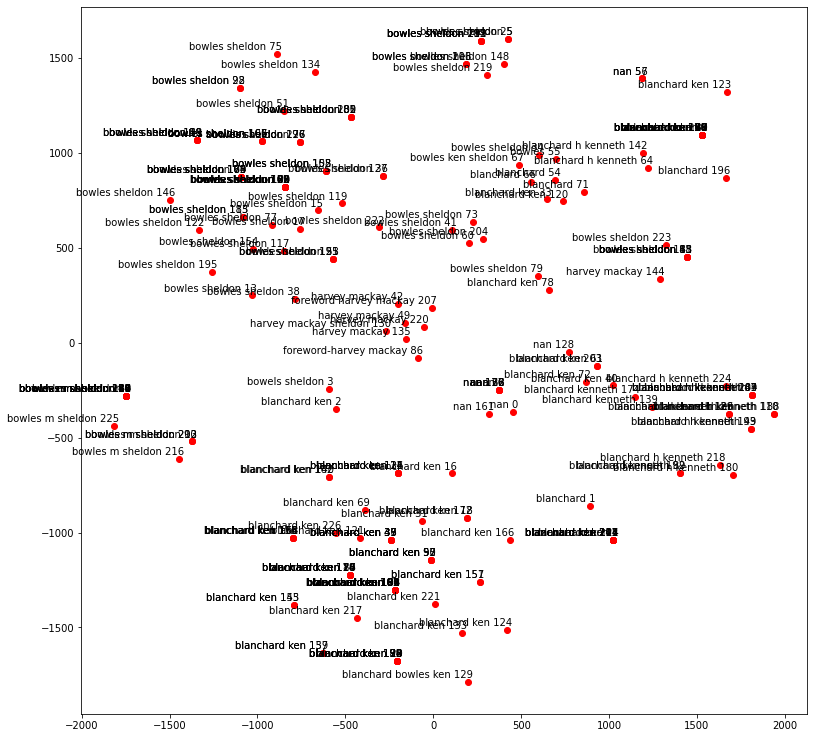

cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.005495786666870117
num of classes: 10


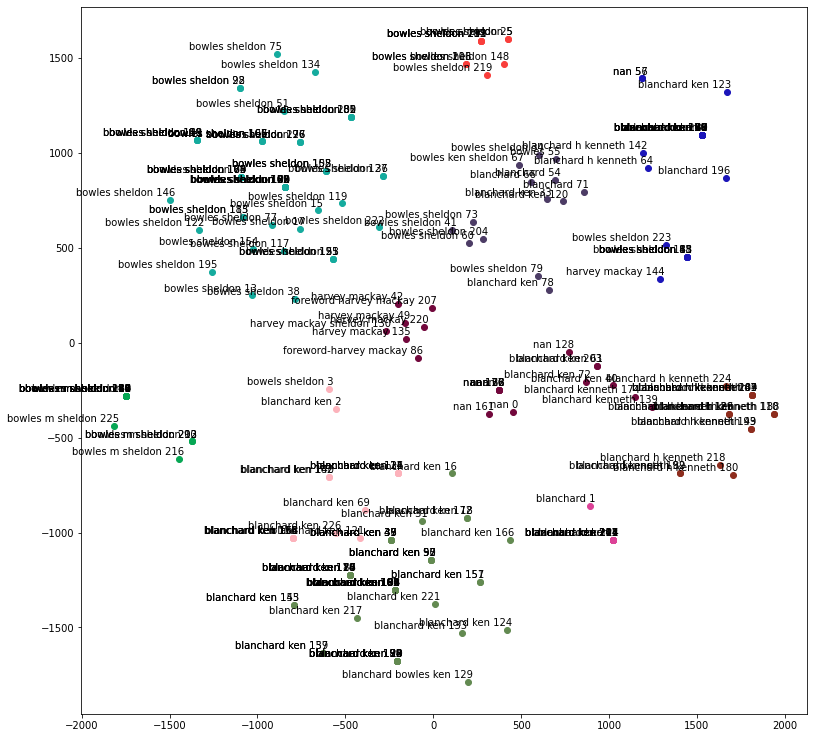

Discarted candidate: [{'blanchard': 1, 'blanchard h kenneth': 2, 'blanchard ken': 13, 'bowles sheldon': 6, 'harvey mackay': 1, 'nan': 2}, {'blanchard ken': 4, 'blanchard kenneth': 2, 'foreword harvey mackay': 1, 'foreword-harvey mackay': 1, 'harvey mackay': 4, 'harvey mackay sheldon': 1, 'nan': 8}, {'blanchard ken': 14, 'bowels sheldon': 1}, {'blanchard h kenneth': 13, 'blanchard kenneth': 2}, {'bowles m sheldon': 15}, {'blanchard': 3, 'blanchard ken': 3, 'bowles': 1, 'bowles ken sheldon': 1, 'bowles sheldon': 6}, {'bowles sheldon': 10}, {'blanchard': 1, 'blanchard ken': 8}]
Possible candidate: [{'bowles sheldon': 55}, {'blanchard bowles ken': 1, 'blanchard ken': 48}]
lengthNecessary: 34.199999999999996
[{'bowles sheldon': 55}, {'blanchard bowles ken': 1, 'blanchard ken': 48}]
['bowles sheldon', 'blanchard ken'] VS true_author: Ken Blanchard, Sheldon Bowles
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book

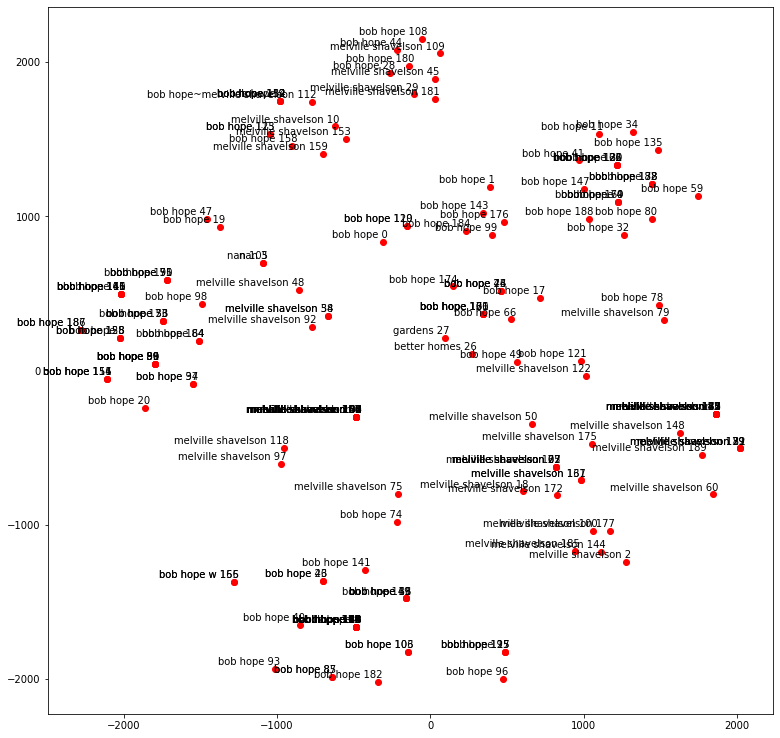

cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.0025861263275146484
num of classes: 10


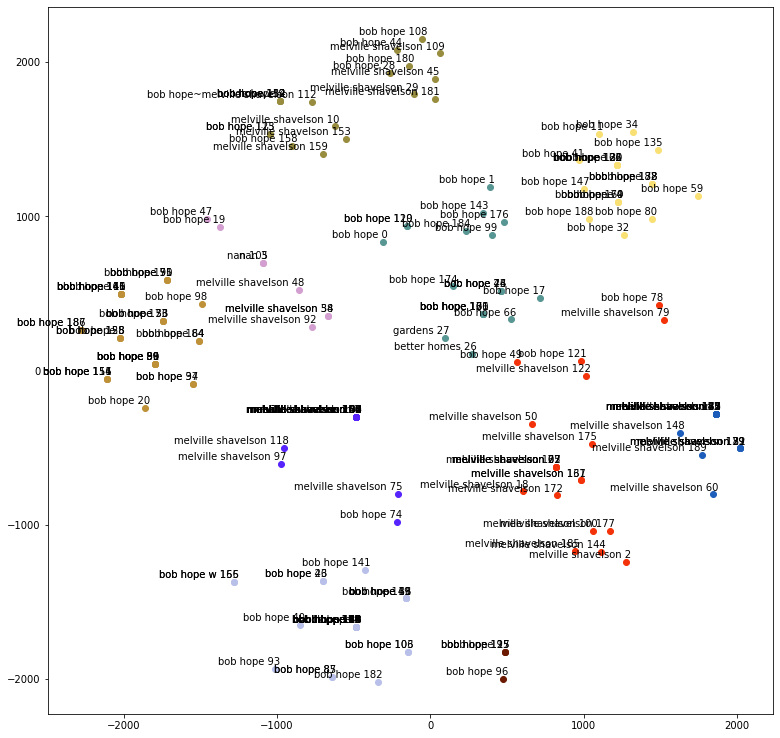

Discarted candidate: [{'better homes': 1, 'bob hope': 18, 'gardens': 1}, {'bob hope': 3, 'melville shavelson': 17}, {'bob hope': 1, 'melville shavelson': 19}, {'bob hope': 19}, {'bob hope': 11, 'bob hope~melville shavelson': 1, 'melville shavelson': 7}, {'melville shavelson': 17}, {'bob hope': 2, 'melville shavelson': 4, 'nan': 2}, {'bob hope': 4}]
Possible candidate: [{'bob hope': 32, 'bob hope w': 2}, {'bob hope': 30}]
lengthNecessary: 28.65
[{'bob hope': 32, 'bob hope w': 2}, {'bob hope': 30}]
['bob hope', 'bob hope'] VS true_author: Bob Hope, Melville Shavelson


In [20]:
for index in range(0,9):
    print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")
    print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>book number {0}<<<<<<<<<<<<<<<<<<<<<<<<".format(index+1))
    table_ISBN, list_authors, true_author = load_by_index(table_group_by_isbn, isbn_list, true_authors, index, key_values['verbose'])
    print("tot cases of author's name: {0}".format(len(table_ISBN['author'].value_counts())))
    embeddings_tokens = sentence_embedding(table_ISBN, key_values)
    tsne_embeddings = dimension_reduction_algorithms(embeddings_tokens, key_values)
    plotChart(list_authors, tsne_embeddings)
    blocks = cluster_algorithm(tsne_embeddings, key_values)
    plotCluster(blocks, list_authors, key_values['num_clusters'], tsne_embeddings)    
    listCandidates = get_author_candidates(list_authors, blocks, key_values['block_length_thresold'] * len(tsne_embeddings), key_values['verbose'])
    print(listCandidates)
    print("{0} VS true_author: {1}".format(getFinalAuthors(listCandidates), true_author))

## ['author','title','big_cate', 'small_cate']

In [21]:
key_values = {
    'model_type':'bilstm',
    'char_level':False,
    'model_version': 2,
    'rnn_dim':1024,
    'verbose':1,
    'attributes_list': ['author','title', 'big_cate', 'small_cate'],
    'embedding_type': 'inferSent',
    'dataset': 'merged_book-multiAuthors',
    'dimension_reduction': 'tsne',
    'perplexity': 10,
    'method': 'barnes_hut',
    'early_exaggeration': 12,
    'num_components': 2,
    'cluster_method': 'hierarchy',
    'num_clusters': 10,
    'block_length_thresold': 0.15, #<--- less
}

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 1<<<<<<<<<<<<<<<<<<<<<<<<
ISBN: 1878685546
true author: Alan Shepard, Deke Slayton
tot cases of author's name: 16
embedding_type: inferSent
attributes_list: ['author', 'title', 'big_cate', 'small_cate']
model_type: bilstm
char_level: False
Embedding time is: 4.167137861251831
dimension_reduction: tsne
num_components: 2
perplexity: 10
early_exaggeration: 12
method: barnes_hut
starting dimension: 2048
Dimension reduction time is: 6.0134148597717285
rows: 454
classes: 454


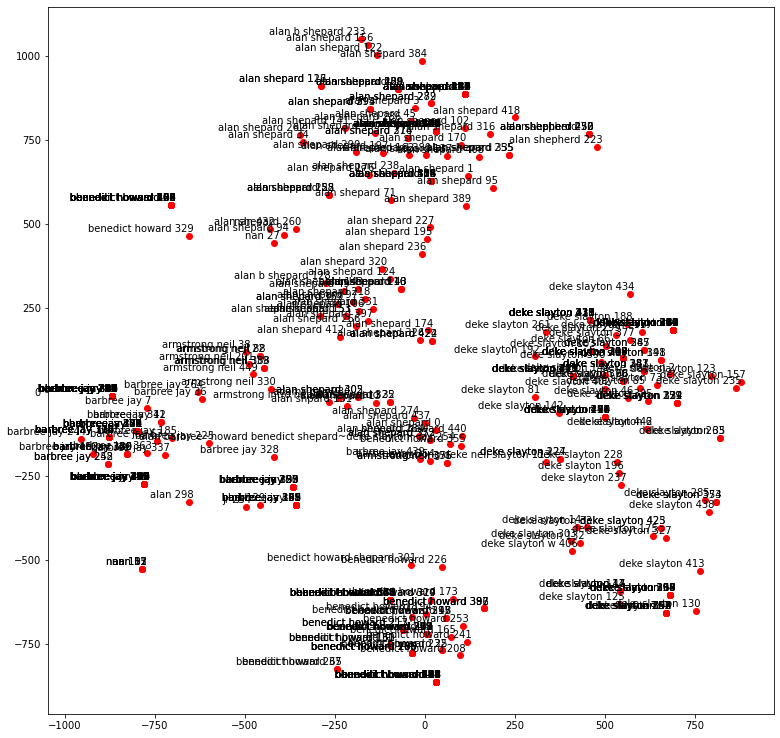

cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.006819963455200195
num of classes: 10


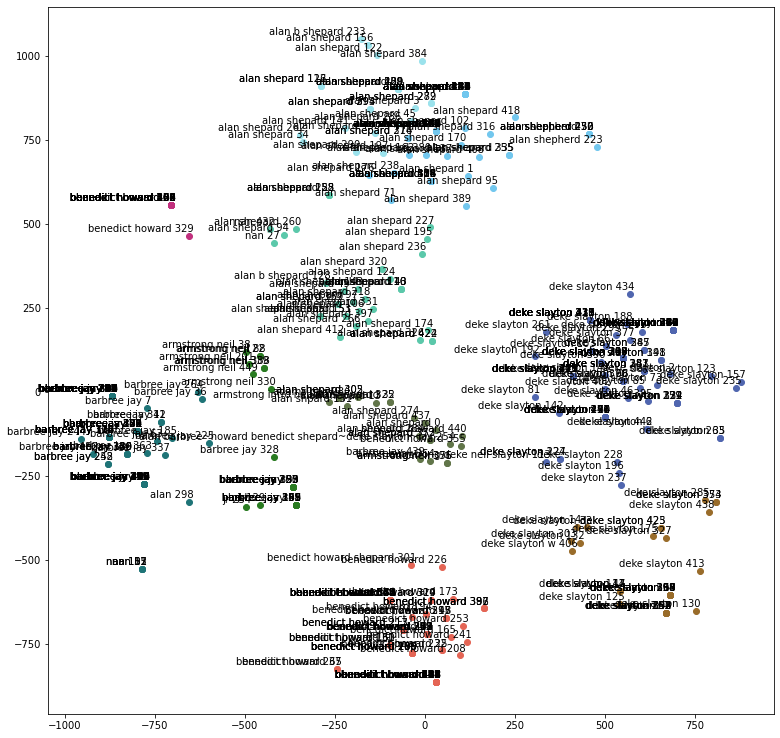

Discarted candidate: [{'alan shepard': 60, 'alan shepherd': 5}, {'alan b shepard': 1, 'alan shepard': 30, 'alan shepherd': 1, 'nan': 2}, {'deke slayton': 31, 'deke slayton w': 1}, {'armstrong neil': 8, 'barbree jay': 14, 'jr': 2}, {'alan b shepard': 1, 'alan shepard': 22}, {'adams ben': 1, 'alan barbree~howard benedict shepard~deke slayton~jay': 1, 'alan shepard': 11, 'alan shpard': 1, 'armstrong intro neil': 1, 'armstrong neil': 2, 'barbree jay': 2, 'benedict howard': 2}, {'benedict howard': 14}]
Possible candidate: [{'armstrong deke neil slayton': 1, 'deke slayton': 90}, {'alan': 1, 'barbree jay': 73, 'nan': 4}, {'benedict howard': 71, 'benedict howard shepard': 1}]
lengthNecessary: 68.1
[{'armstrong deke neil slayton': 1, 'deke slayton': 90}, {'alan': 1, 'barbree jay': 73, 'nan': 4}, {'benedict howard': 71, 'benedict howard shepard': 1}]
['deke slayton', 'barbree jay', 'benedict howard'] VS true_author: Alan Shepard, Deke Slayton
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>

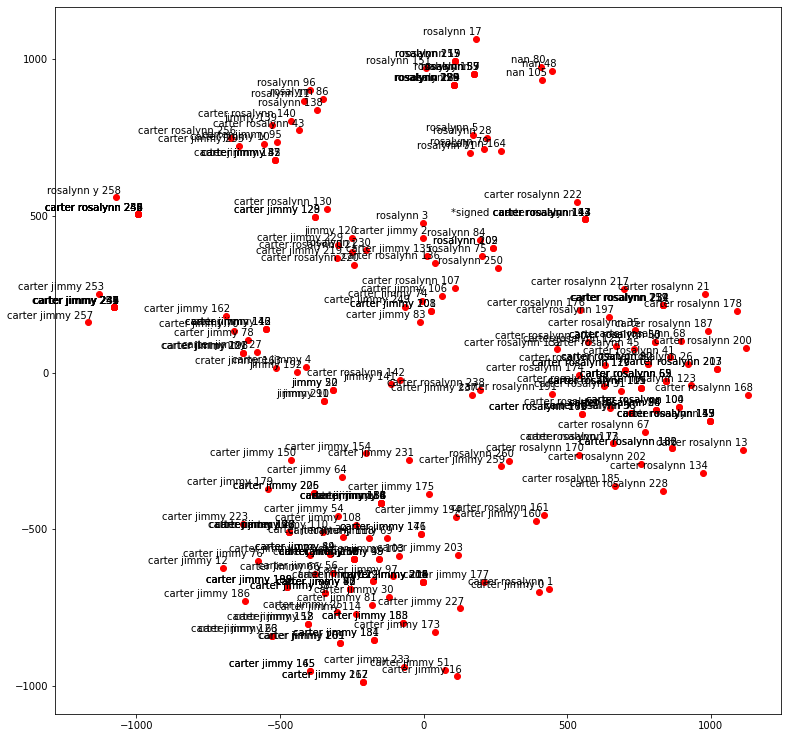

cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.005293130874633789
num of classes: 10


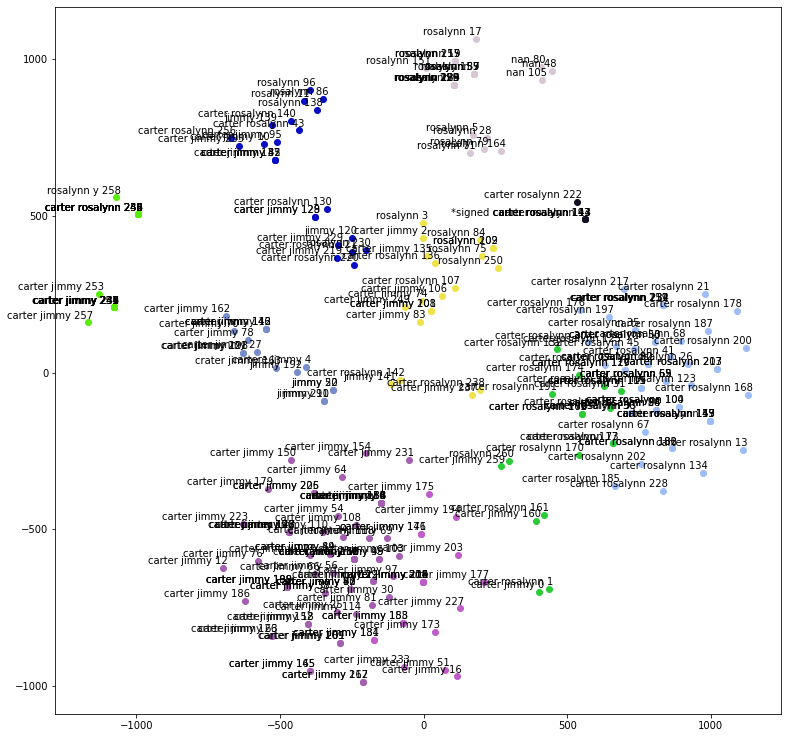

Discarted candidate: [{'carter jimmy': 10, 'carter rosalynn': 6, 'jimmy': 2, 'rosalynn': 5}, {'nan': 3, 'rosalynn': 19}, {'carter jimmy': 9, 'carter rosalynn': 4, 'jimmy': 1, 'rosalynn': 6}, {'carter jimmy': 19}, {'carter jimmy': 10, 'carter rosalynn': 7, 'rosalynn y': 1}, {'carter jimmy': 3, 'carter rosalynn': 13, 'rosalynn': 1}, {'carter jimmy': 9, 'cartere jimmy': 1, 'crater jimmy': 1, 'jimmy': 5}, {'*signed carter rosalynn': 1, 'carter rosalynn': 4}]
Possible candidate: [{'carter jimmy': 66}, {'carter rosalynn': 55}]
lengthNecessary: 39.15
[{'carter jimmy': 66}, {'carter rosalynn': 55}]
['carter jimmy', 'carter rosalynn'] VS true_author: Jimmy Carter, Rosalynn Carter
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 3<<<<<<<<<<<<<<<<<<<<<<<<
ISBN: 0810932776
true author: Vadim Petrov, Igor Lysenho, Georgy Egorgy
tot cases of author's name: 29
embedding_type: inferSent
attributes_list: ['author',

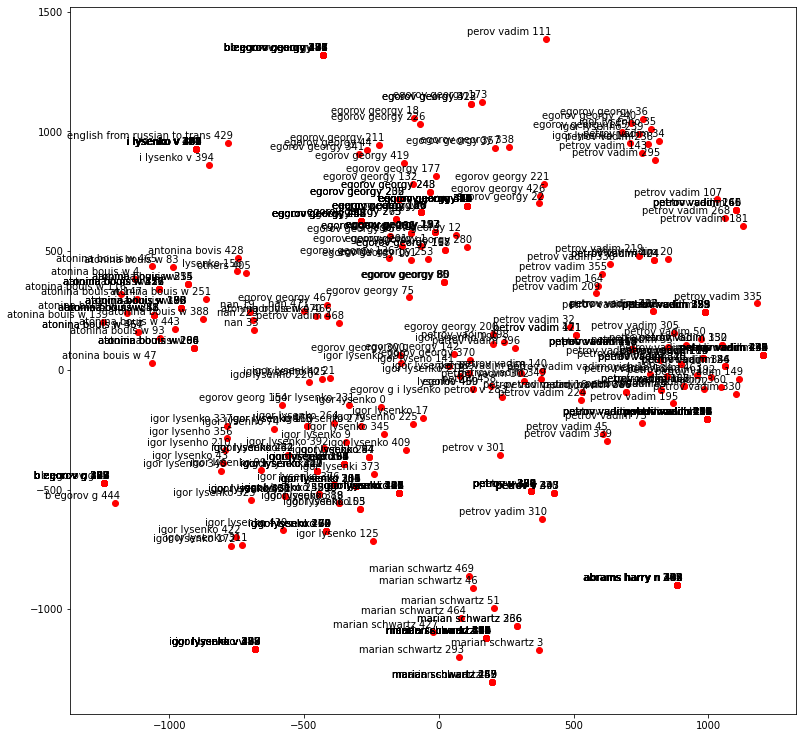

cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.048277854919433594
num of classes: 10


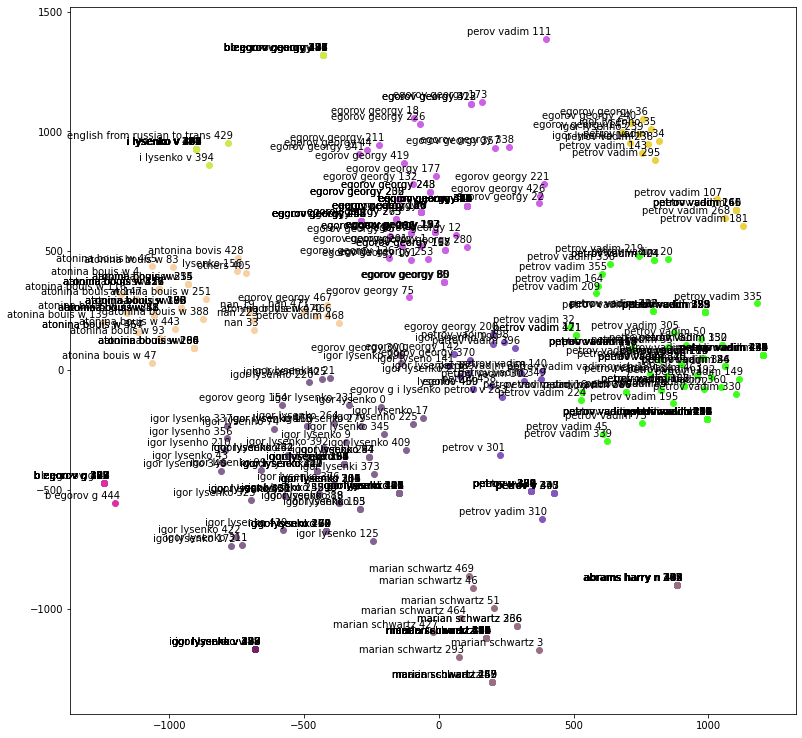

Discarted candidate: [{'abrams harry n': 11, 'marian schwartz': 41}, {'antonina bovis': 1, 'atonina bouis w': 39, 'egorov georgy': 1, 'igor lysenko': 1, 'lysenko': 1, 'nan': 4, 'others': 1, 'petrov vadim': 1}, {'egorov': 1, 'egorov g i lysenko petrov v': 1, 'egorov georgy': 2, 'egoroy georgy': 1, 'igor lysenho': 1, 'igor lysenko': 2, 'igor lyseno': 1, 'lysenho': 1, 'petrov': 1, 'petrov v': 15, 'petrov vadim': 5, 'petrov vaoim': 1, 'petrov yadim': 1}, {'b egorov georgy': 12, 'english from russian to trans': 1, 'i lysenko v': 13}, {'egorov georgy': 3, 'igor lysenho': 2, 'igor lysenko': 1, 'petrov vadim': 11}, {'b egorov g': 16}, {'igor lysenko v': 11}]
Possible candidate: [{'petrov vadim': 90, 'petrov vadim vadimovich': 10}, {'egorov georg': 1, 'egorov georgy': 1, 'igor lysenho': 7, 'igor lysenkho': 1, 'igor lysenki': 6, 'igor lysenko': 69}, {'egorov georgy': 82, 'perov vadim': 1}]
lengthNecessary: 70.8
[{'petrov vadim': 90, 'petrov vadim vadimovich': 10}, {'egorov georg': 1, 'egorov geo

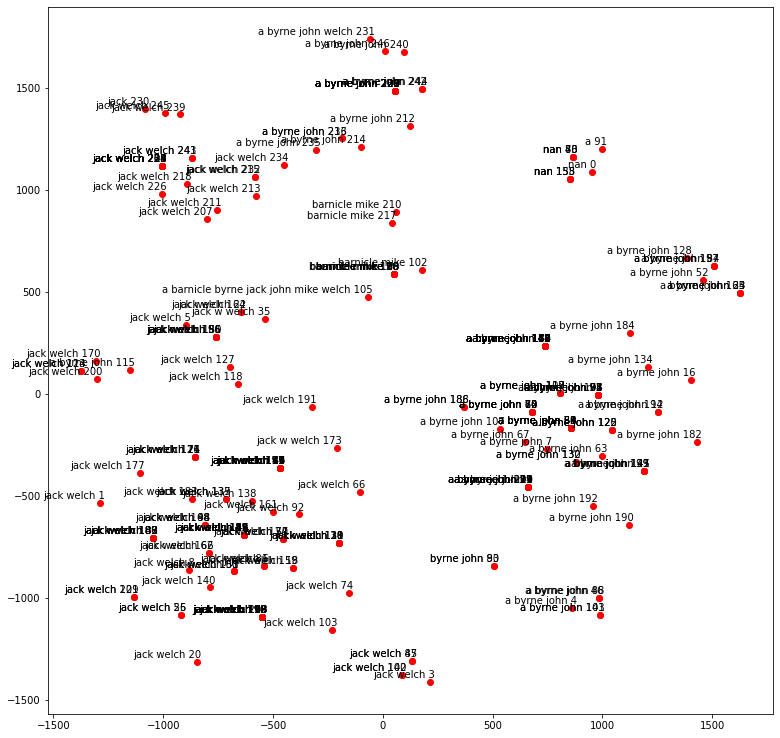

cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.005274772644042969
num of classes: 10


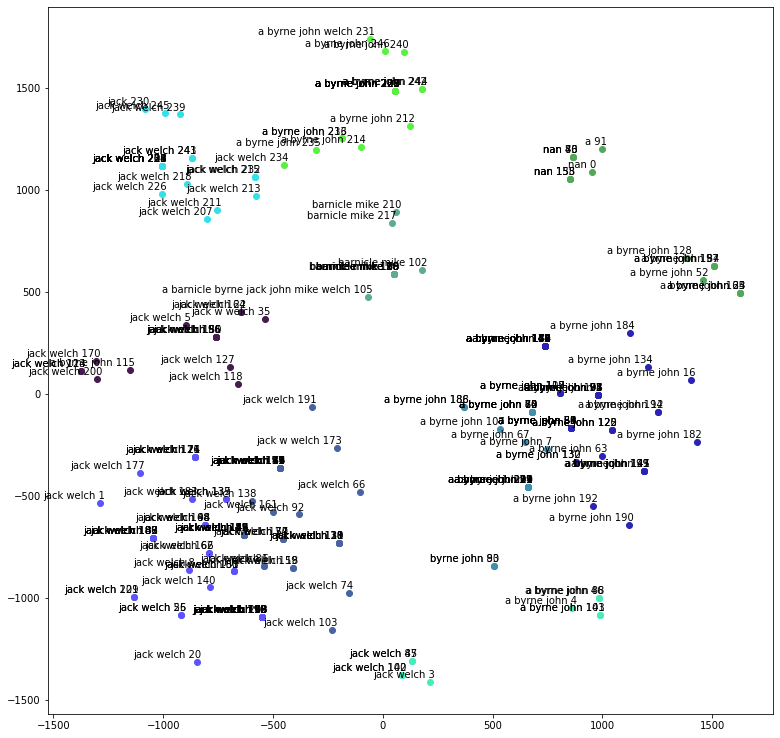

Discarted candidate: [{'a byrne john': 19, 'byrne john': 2}, {'jack': 1, 'jack welch': 20}, {'a byrne john': 17, 'a byrne john welch': 1, 'jack welch': 1}, {'a': 1, 'a byrne john': 8, 'nan': 7}, {'a byrne john': 1, 'jack w welch': 1, 'jack welch': 14}, {'a barnicle byrne jack john mike welch': 1, 'barnicle mike': 10}, {'a byrne john': 5, 'jack welch': 5}]
Possible candidate: [{'a byrne john': 53}, {'jack welch': 41}, {'jack w welch': 1, 'jack welch': 38}]
lengthNecessary: 37.05
[{'a byrne john': 53}, {'jack welch': 41}, {'jack w welch': 1, 'jack welch': 38}]
['a byrne john', 'jack welch', 'jack welch'] VS true_author: Jack Welch, John A. Byrne
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 5<<<<<<<<<<<<<<<<<<<<<<<<
ISBN: 0060852550
true author: Barbara Kingsolver, Steven L. Hopp, Camille Kingsolver
tot cases of author's name: 9
embedding_type: inferSent
attributes_list: ['author', 'title', 'big_c

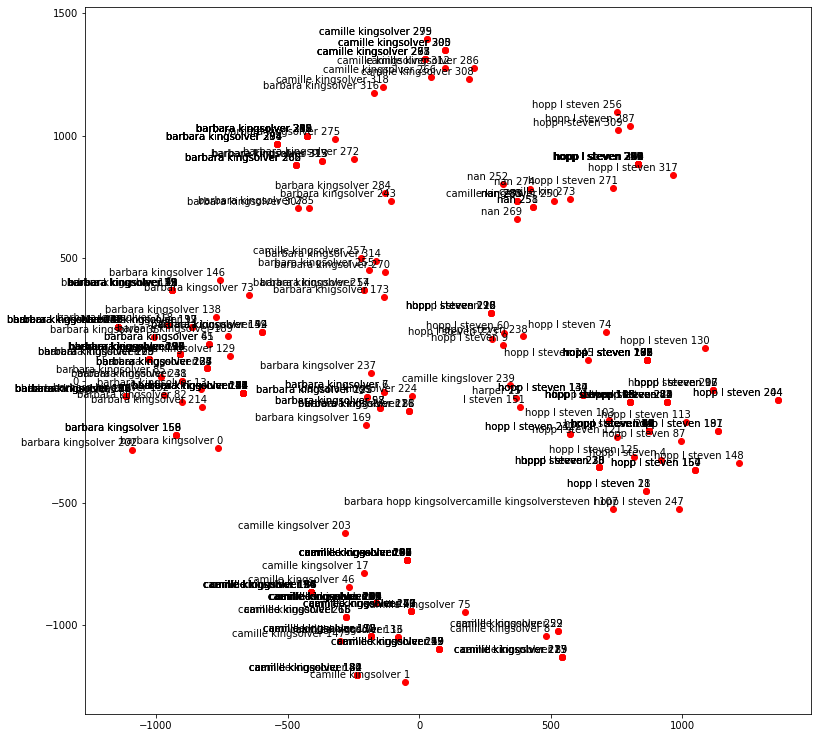

cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.029573917388916016
num of classes: 10


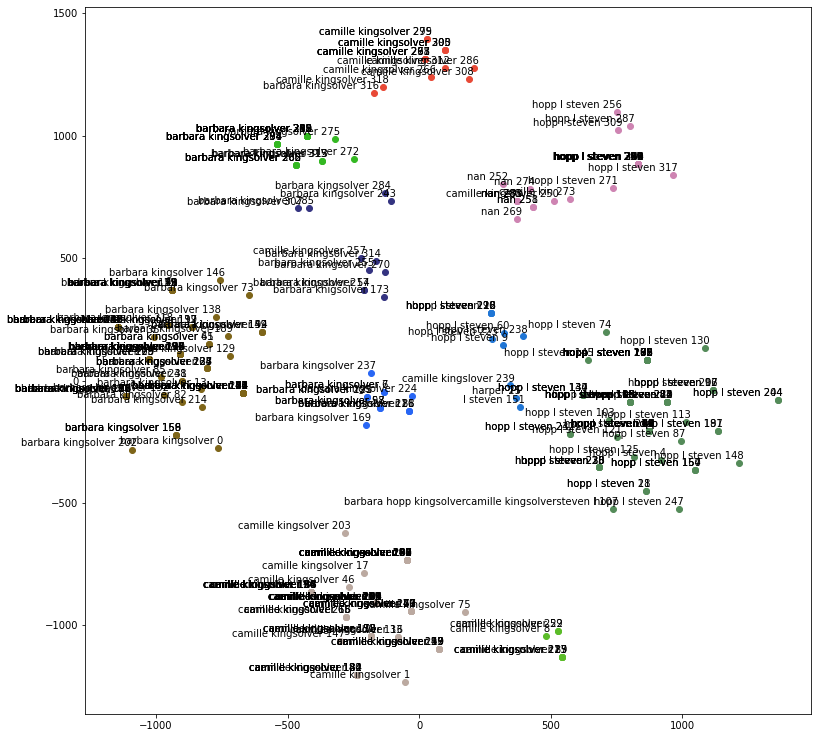

Discarted candidate: [{'camille kin': 1, 'camille kingslover': 1, 'hopp l steven': 17, 'nan': 8}, {'barbara kingsolver': 22}, {'barbara kingsolver': 1, 'camille kingsolver': 14}, {'barbara kingsolver': 12}, {'camille kingslover': 1, 'harper': 1, 'hopp l steven': 8, 'l steven': 1}, {'barbara kingsolver': 9, 'barbara knigsolver': 1, 'camille kingsolver': 1}, {'camille kingsolver': 7}]
Possible candidate: [{'barbara kingsolver': 74}, {'camille kingsolver': 70}, {'barbara hopp kingsolvercamille kingsolversteven l': 1, 'hopp l steven': 69}]
lengthNecessary: 47.85
[{'barbara kingsolver': 74}, {'camille kingsolver': 70}, {'barbara hopp kingsolvercamille kingsolversteven l': 1, 'hopp l steven': 69}]
['barbara kingsolver', 'camille kingsolver', 'hopp l steven'] VS true_author: Barbara Kingsolver, Steven L. Hopp, Camille Kingsolver
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 6<<<<<<<<<<<<<<<<<<<<<<<<
IS

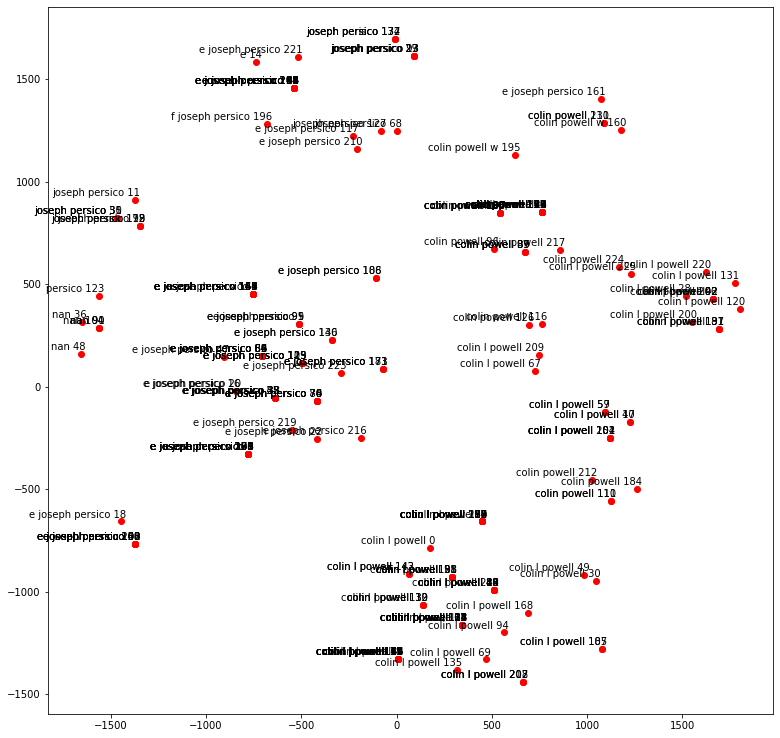

cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.004624843597412109
num of classes: 10


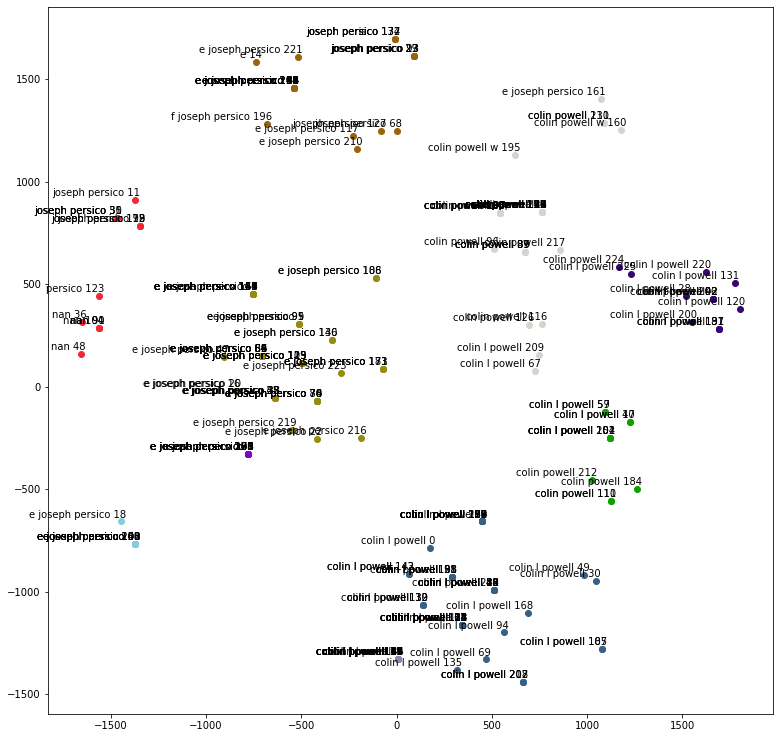

Discarted candidate: [{'colin l powell': 2, 'colin powell': 26, 'colin powell w': 2, 'e joseph persico': 1}, {'e': 1, 'e joseph persico': 13, 'f joseph persico': 1, 'joseph perisco': 1, 'joseph persico': 8}, {'colin l powell': 16}, {'colin l powell': 13, 'colin powell': 1}, {'joseph persico': 7, 'nan': 5, 'persico': 1}, {'colin l powell': 8, 'colin powell': 4}, {'e joseph persico': 10}, {'e joseph persico': 8}]
Possible candidate: [{'colin l powell': 50}, {'e joseph persico': 48}]
lengthNecessary: 33.9
[{'colin l powell': 50}, {'e joseph persico': 48}]
['colin l powell', 'e joseph persico'] VS true_author: Colin Powell, Joseph E. Persico
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 7<<<<<<<<<<<<<<<<<<<<<<<<
ISBN: 0060852569
true author: Barbara Kingsolver, Steven L. Hopp, Camille Kingsolver
tot cases of author's name: 14
embedding_type: inferSent
attributes_list: ['author', 'title', 'big_cate',

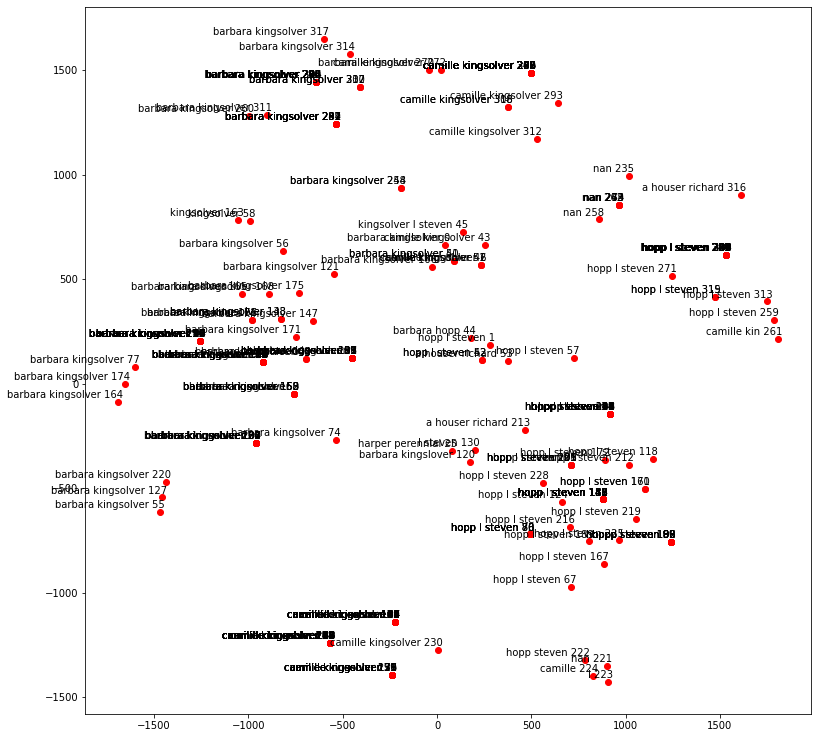

cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.005772829055786133
num of classes: 10


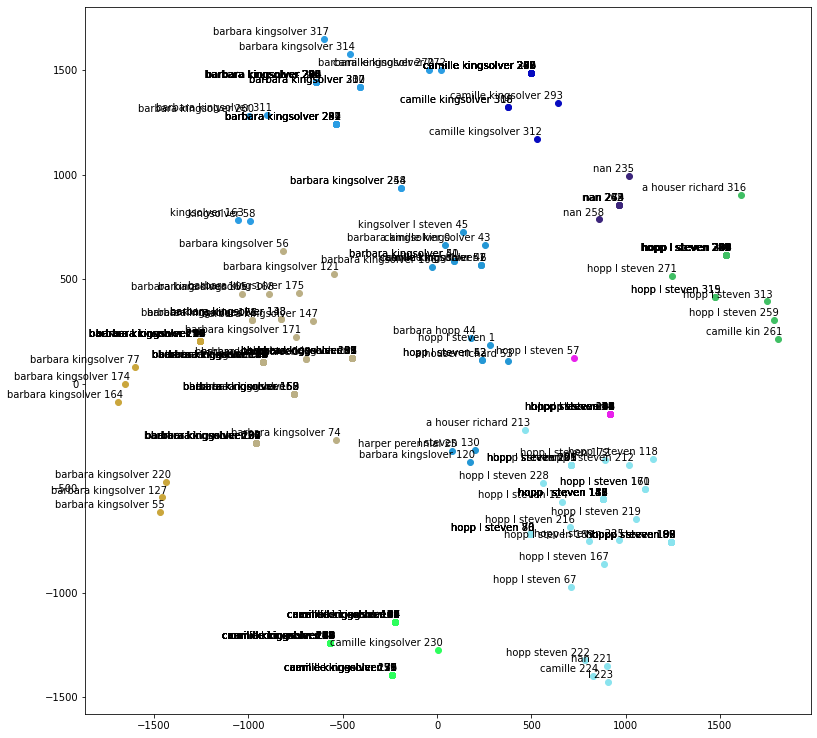

Discarted candidate: [{'barbara kingsolver': 31, 'camille kingsolver': 1, 'kingsolver': 2}, {'a houser richard': 1, 'camille kin': 1, 'hopp l steven': 25}, {'barbara kingsolver': 26}, {'camille kingsolver': 22}, {'hopp l steven': 18}, {'a houser richard': 1, 'barbara hopp': 1, 'barbara kingslover': 1, 'barbara kingsolver': 4, 'camille kingsolver': 4, 'harper perennial': 1, 'hopp l steven': 3, 'kingsolver l steven': 1, 'l steven': 1}, {'nan': 7}]
Possible candidate: [{'camille kingsolver': 64}, {'barbara kingsolver': 54}, {'a houser richard': 1, 'camille': 1, 'hopp l steven': 46, 'hopp steven': 1, 'l': 1, 'nan': 1}]
lengthNecessary: 48.0
[{'camille kingsolver': 64}, {'barbara kingsolver': 54}, {'a houser richard': 1, 'camille': 1, 'hopp l steven': 46, 'hopp steven': 1, 'l': 1, 'nan': 1}]
['camille kingsolver', 'barbara kingsolver', 'hopp l steven'] VS true_author: Barbara Kingsolver, Steven L. Hopp, Camille Kingsolver
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>

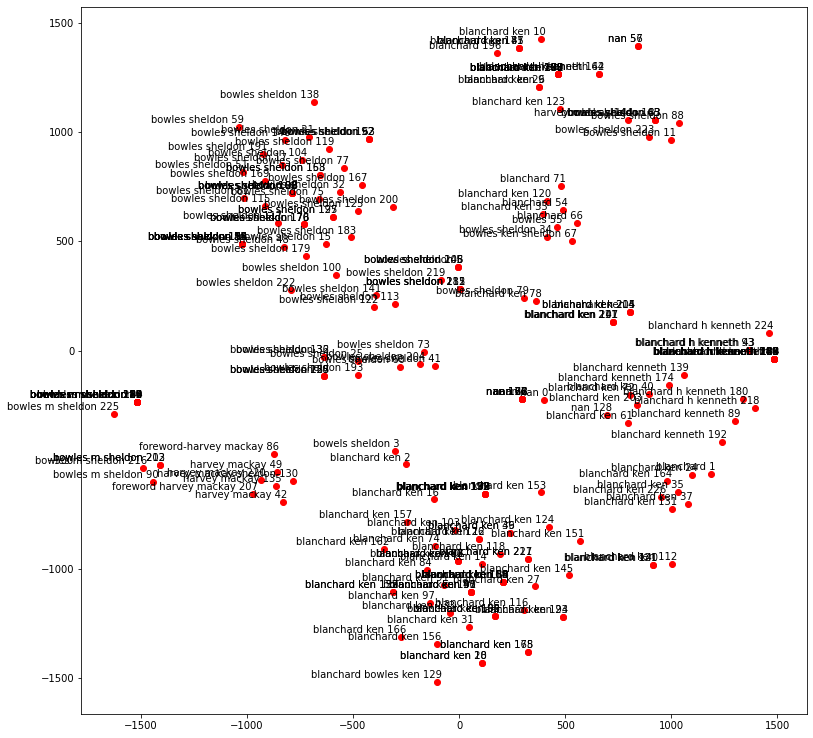

cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.005216121673583984
num of classes: 10


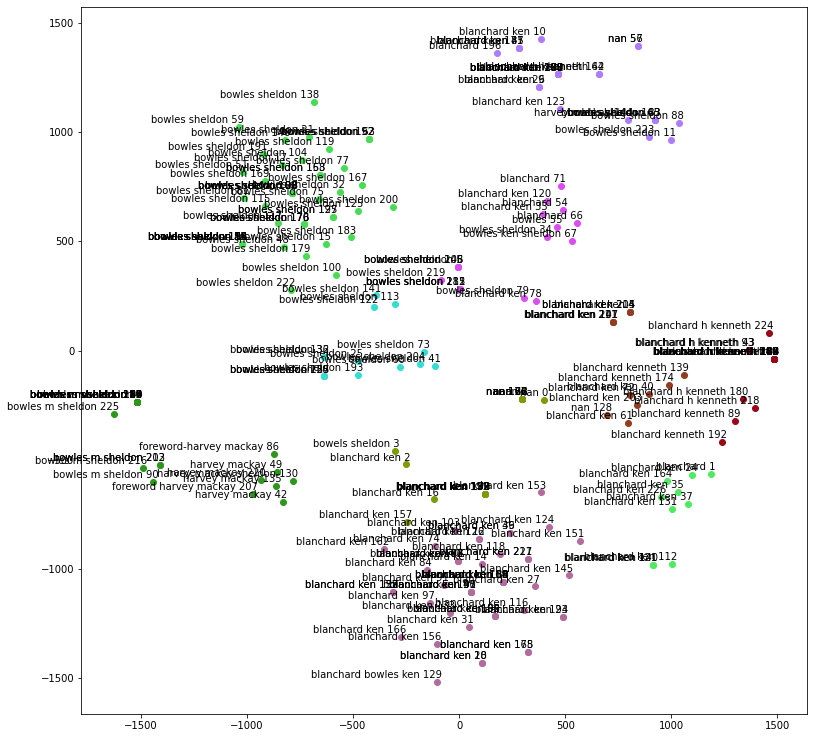

Discarted candidate: [{'blanchard': 1, 'blanchard h kenneth': 2, 'blanchard ken': 13, 'bowles sheldon': 6, 'harvey mackay': 1, 'nan': 2}, {'bowles m sheldon': 15, 'foreword harvey mackay': 1, 'foreword-harvey mackay': 1, 'harvey mackay': 4, 'harvey mackay sheldon': 1}, {'blanchard': 3, 'blanchard ken': 3, 'bowles': 1, 'bowles ken sheldon': 1, 'bowles sheldon': 9}, {'blanchard ken': 8, 'bowels sheldon': 1, 'nan': 7}, {'blanchard h kenneth': 13, 'blanchard kenneth': 2}, {'bowles sheldon': 14}, {'blanchard ken': 10, 'blanchard kenneth': 2, 'nan': 1}, {'blanchard': 1, 'blanchard ken': 9}]
Possible candidate: [{'blanchard bowles ken': 1, 'blanchard ken': 47}, {'bowles sheldon': 48}]
lengthNecessary: 34.199999999999996
[{'blanchard bowles ken': 1, 'blanchard ken': 47}, {'bowles sheldon': 48}]
['blanchard ken', 'bowles sheldon'] VS true_author: Ken Blanchard, Sheldon Bowles
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>

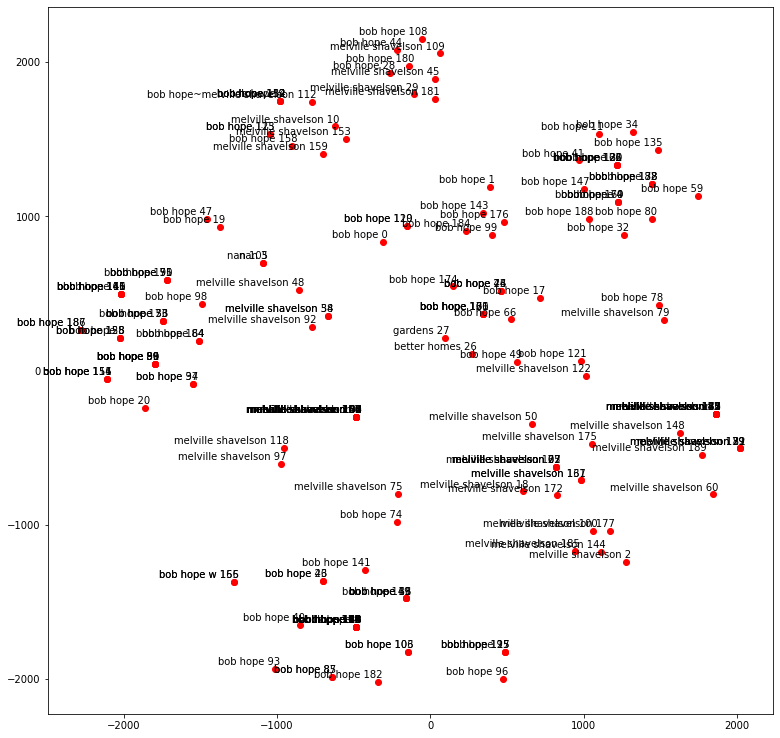

cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.006056785583496094
num of classes: 10


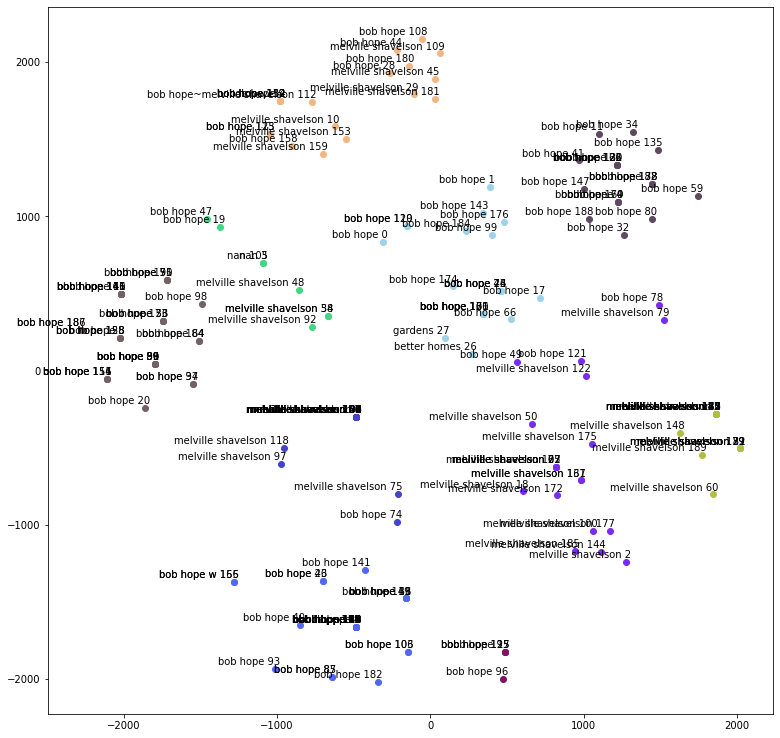

Discarted candidate: [{'better homes': 1, 'bob hope': 18, 'gardens': 1}, {'bob hope': 3, 'melville shavelson': 17}, {'bob hope': 1, 'melville shavelson': 19}, {'bob hope': 19}, {'bob hope': 11, 'bob hope~melville shavelson': 1, 'melville shavelson': 7}, {'melville shavelson': 17}, {'bob hope': 2, 'melville shavelson': 4, 'nan': 2}, {'bob hope': 4}]
Possible candidate: [{'bob hope': 32, 'bob hope w': 2}, {'bob hope': 30}]
lengthNecessary: 28.65
[{'bob hope': 32, 'bob hope w': 2}, {'bob hope': 30}]
['bob hope', 'bob hope'] VS true_author: Bob Hope, Melville Shavelson


In [22]:
for index in range(0,9):
    print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")
    print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>book number {0}<<<<<<<<<<<<<<<<<<<<<<<<".format(index+1))
    table_ISBN, list_authors, true_author = load_by_index(table_group_by_isbn, isbn_list, true_authors, index, key_values['verbose'])
    print("tot cases of author's name: {0}".format(len(table_ISBN['author'].value_counts())))
    embeddings_tokens = sentence_embedding(table_ISBN, key_values)
    tsne_embeddings = dimension_reduction_algorithms(embeddings_tokens, key_values)
    plotChart(list_authors, tsne_embeddings)
    blocks = cluster_algorithm(tsne_embeddings, key_values)
    plotCluster(blocks, list_authors, key_values['num_clusters'], tsne_embeddings)    
    listCandidates = get_author_candidates(list_authors, blocks, key_values['block_length_thresold'] * len(tsne_embeddings), key_values['verbose'])
    print(listCandidates)
    print("{0} VS true_author: {1}".format(getFinalAuthors(listCandidates), true_author))

## ['author','title','big_cate', 'small_cate', 'publisher']

In [23]:
key_values = {
    'model_type':'bilstm',
    'char_level':False,
    'model_version': 2,
    'rnn_dim':1024,
    'verbose':1,
    'attributes_list': ['author','title', 'big_cate', 'small_cate', 'publisher'],
    'embedding_type': 'inferSent',
    'dataset': 'merged_book-multiAuthors',
    'dimension_reduction': 'tsne',
    'perplexity': 10,
    'method': 'barnes_hut',
    'early_exaggeration': 12,
    'num_components': 2,
    'cluster_method': 'hierarchy',
    'num_clusters': 10,
    'block_length_thresold': 0.15, #<--- less
}

In [24]:
for index in range(0,9):
    print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")
    print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>book number {0}<<<<<<<<<<<<<<<<<<<<<<<<".format(index+1))
    table_ISBN, list_authors, true_author = load_by_index(table_group_by_isbn, isbn_list, true_authors, index, key_values['verbose'])
    print("tot cases of author's name: {0}".format(len(table_ISBN['author'].value_counts())))
    embeddings_tokens = sentence_embedding(table_ISBN, key_values)
    tsne_embeddings = dimension_reduction_algorithms(embeddings_tokens, key_values)
    #plotChart(list_authors, tsne_embeddings)
    blocks = cluster_algorithm(tsne_embeddings, key_values)
    #plotCluster(blocks, list_authors, key_values['num_clusters'], tsne_embeddings)    
    listCandidates = get_author_candidates(list_authors, blocks, key_values['block_length_thresold'] * len(tsne_embeddings), key_values['verbose'])
    print(listCandidates)
    print("{0} VS true_author: {1}".format(getFinalAuthors(listCandidates), true_author))

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 1<<<<<<<<<<<<<<<<<<<<<<<<
ISBN: 1878685546
true author: Alan Shepard, Deke Slayton
tot cases of author's name: 16
embedding_type: inferSent
attributes_list: ['author', 'title', 'big_cate', 'small_cate', 'publisher']
model_type: bilstm
char_level: False
Embedding time is: 3.430596113204956
dimension_reduction: tsne
num_components: 2
perplexity: 10
early_exaggeration: 12
method: barnes_hut
starting dimension: 2048
Dimension reduction time is: 5.938002109527588
cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.009519815444946289
Discarted candidate: [{'deke slayton': 66, 'deke slayton w': 1}, {'adams ben': 1, 'alan barbree~howard benedict shepard~deke slayton~jay': 1, 'alan shepard': 27, 'alan shpard': 1, 'armstrong intro neil': 1, 'armstrong neil': 2, 'barbree jay': 2, 'benedict howard': 26, 'benedict howard shepard': 1, 'nan': 2}, {'alan 

Dimension reduction time is: 3.2990379333496094
cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.003483295440673828
Discarted candidate: [{'colin l powell': 3, 'colin powell': 6, 'e joseph persico': 4, 'f joseph persico': 1, 'joseph perisco': 1, 'joseph persico': 11}, {'colin l powell': 11, 'colin powell': 6}, {'e joseph persico': 17}, {'colin l powell': 8, 'colin powell': 5, 'colin powell w': 2, 'e joseph persico': 2}, {'colin l powell': 5, 'colin powell': 12}, {'e': 1, 'e joseph persico': 8, 'joseph persico': 3}, {'colin l powell': 11, 'colin powell': 1}, {'joseph persico': 1, 'nan': 5, 'persico': 1}]
Possible candidate: [{'colin l powell': 51, 'colin powell': 1}, {'e joseph persico': 49}]
lengthNecessary: 33.9
[{'colin l powell': 51, 'colin powell': 1}, {'e joseph persico': 49}]
['colin l powell', 'e joseph persico'] VS true_author: Colin Powell, Joseph E. Persico
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>

## ['author']

In [25]:
key_values = {
    'model_type':'bilstm',
    'char_level':False,
    'model_version': 2,
    'rnn_dim':1024,
    'verbose':1,
    'attributes_list': ['author'],
    'embedding_type': 'inferSent',
    'dataset': 'merged_book-multiAuthors',
    'dimension_reduction': 'tsne',
    'perplexity': 10,
    'method': 'barnes_hut',
    'early_exaggeration': 12,
    'num_components': 2,
    'cluster_method': 'hierarchy',
    'num_clusters': 10,
    'block_length_thresold': 0.15, #<--- less
}

for index in range(0,9):
    print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")
    print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>book number {0}<<<<<<<<<<<<<<<<<<<<<<<<".format(index+1))
    table_ISBN, list_authors, true_author = load_by_index(table_group_by_isbn, isbn_list, true_authors, index, key_values['verbose'])
    print("tot cases of author's name: {0}".format(len(table_ISBN['author'].value_counts())))
    embeddings_tokens = sentence_embedding(table_ISBN, key_values)
    tsne_embeddings = dimension_reduction_algorithms(embeddings_tokens, key_values)
    #plotChart(list_authors, tsne_embeddings)
    blocks = cluster_algorithm(tsne_embeddings, key_values)
    #plotCluster(blocks, list_authors, key_values['num_clusters'], tsne_embeddings)    
    listCandidates = get_author_candidates(list_authors, blocks, key_values['block_length_thresold'] * len(tsne_embeddings), key_values['verbose'])
    print(listCandidates)
    print("{0} VS true_author: {1}".format(getFinalAuthors(listCandidates), true_author))

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 1<<<<<<<<<<<<<<<<<<<<<<<<
ISBN: 1878685546
true author: Alan Shepard, Deke Slayton
tot cases of author's name: 16
embedding_type: inferSent
attributes_list: ['author']
model_type: bilstm
char_level: False
Embedding time is: 1.55202317237854
dimension_reduction: tsne
num_components: 2
perplexity: 10
early_exaggeration: 12
method: barnes_hut
starting dimension: 2048
Dimension reduction time is: 6.92509126663208
cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.014168024063110352
Discarted candidate: [{'barbree jay': 65}, {'alan barbree~howard benedict shepard~deke slayton~jay': 1, 'benedict howard': 57}, {'alan b shepard': 2, 'alan shepard': 54}, {'benedict howard': 30, 'benedict howard shepard': 1}, {'adams ben': 1, 'alan': 1, 'alan shpard': 1, 'barbree jay': 20, 'jr': 2}, {'armstrong intro neil': 1, 'armstrong neil': 10}, {'barbree jay':

Dimension reduction time is: 4.152950048446655
cluster_method: hierarchy
num_clusters: 10
Blocking time is: 0.005713939666748047
Discarted candidate: [{'barbara kingsolver': 34, 'kingsolver': 2}, {'camille kingsolver': 33}, {'barbara kingsolver': 31, 'kingsolver l steven': 1}, {'hopp l steven': 30}, {'barbara hopp': 1, 'hopp l steven': 28, 'hopp steven': 1}, {'a houser richard': 3, 'hopp l steven': 17}, {'hopp l steven': 17}, {'barbara kingslover': 1, 'camille': 1, 'camille kin': 1, 'harper perennial': 1, 'l': 1, 'l steven': 1, 'nan': 8}]
Possible candidate: [{'camille kingsolver': 58}, {'barbara kingsolver': 50}]
lengthNecessary: 48.0
[{'camille kingsolver': 58}, {'barbara kingsolver': 50}]
['camille kingsolver', 'barbara kingsolver'] VS true_author: Barbara Kingsolver, Steven L. Hopp, Camille Kingsolver
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
>>>>>>>>>>>>>>>>>>>>>>>>>>>>book number 8<<<<<<<<<<<<<<<<<<<<<<<<
ISBN: 0688123163
tr